In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import warnings
import pickle
import myUtils
import os
from myUtils import *
from models.utils import *
from AOPC import *
from score import ScoreUtils
from models.dataset_loader import *
import sys
sys.path.append('models')

warnings.simplefilter("ignore")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
#torch._C._jit_set_texpr_fuser_enabled(False)
model_name = 'huawei-noah/TinyBERT_General_4L_312D'

In [2]:
sorting = "confidence"
tokenizer = AutoTokenizer.from_pretrained(model_name, use_fast = False)
myUtils.tokenizer = tokenizer

# TinyBert

## Corona-stopwords

In [18]:
ds_name = 'corona'
model_type = 'tinybert'
path = f'results/mp/{model_type}/{ds_name}/{sorting}/'
aopc = AOPC(path, tokenizer, base_opt = 'stop-words')

In [ ]:
aopc.compare_all(verbose=False)

## Corona

In [17]:
ds_name = 'corona'
model_type = 'tinybert'
path = f'results/mp/{model_type}/{ds_name}/{sorting}/'
aopc = AOPC(path, tokenizer)

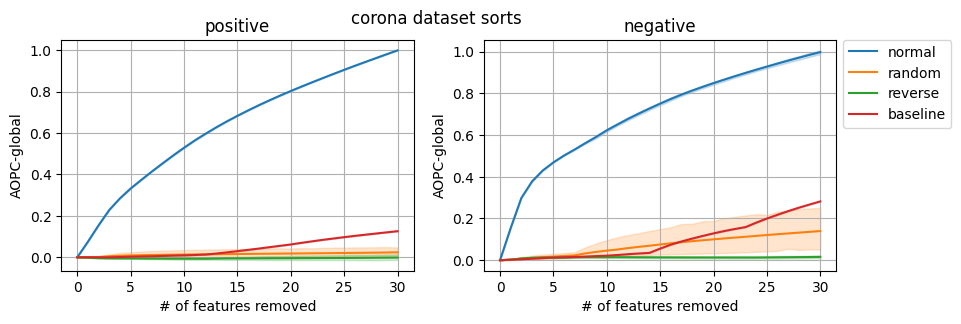

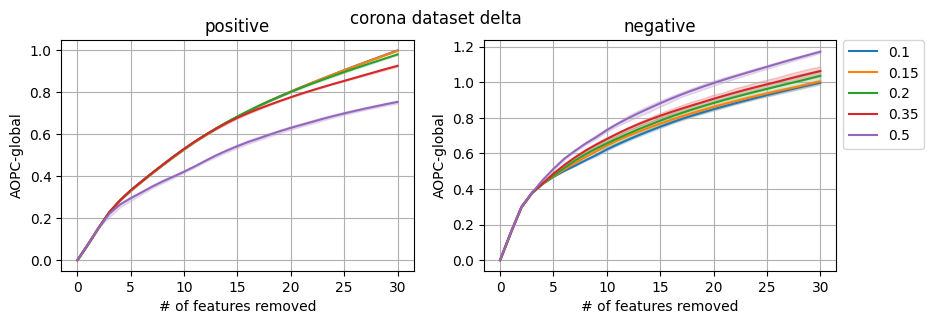

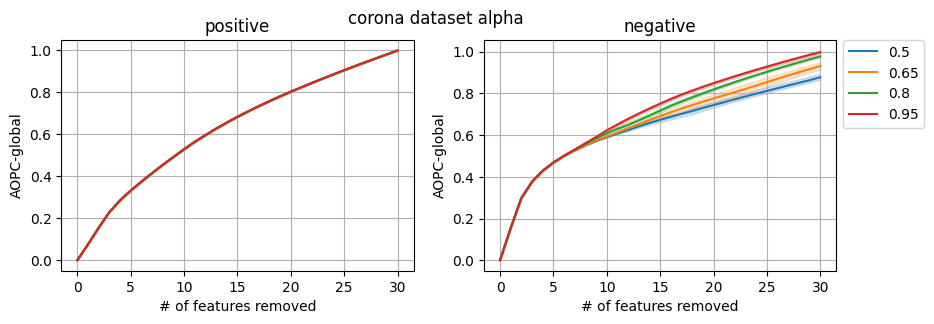

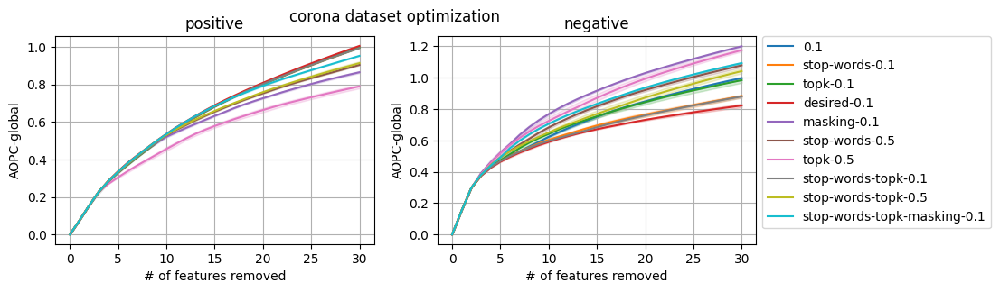

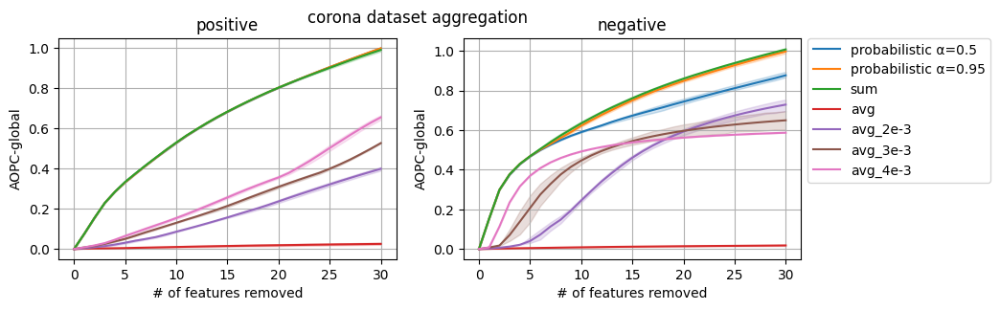

...

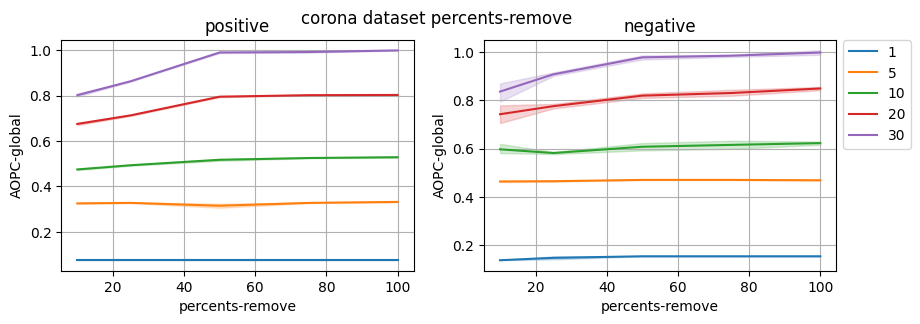

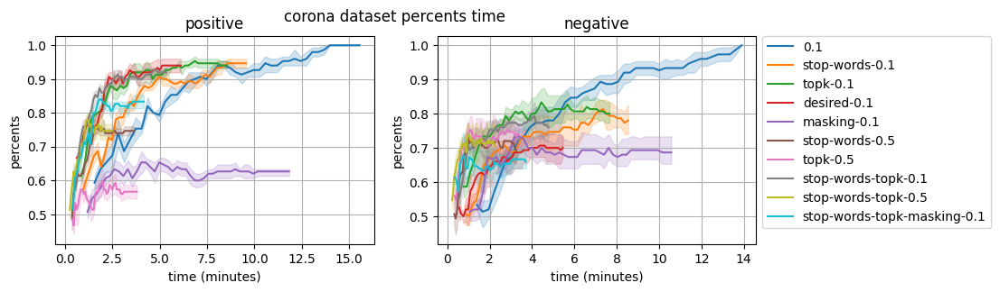

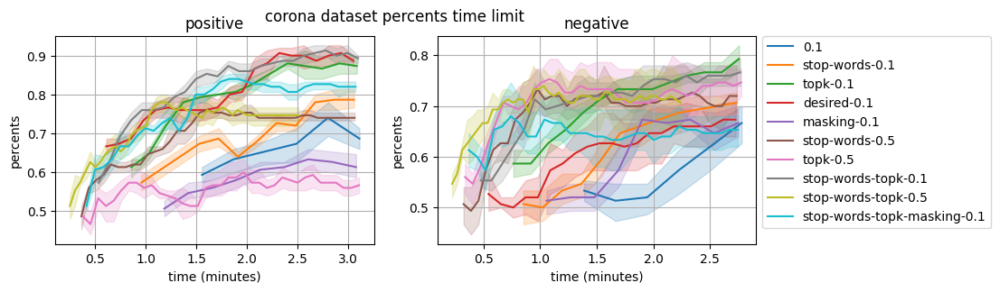

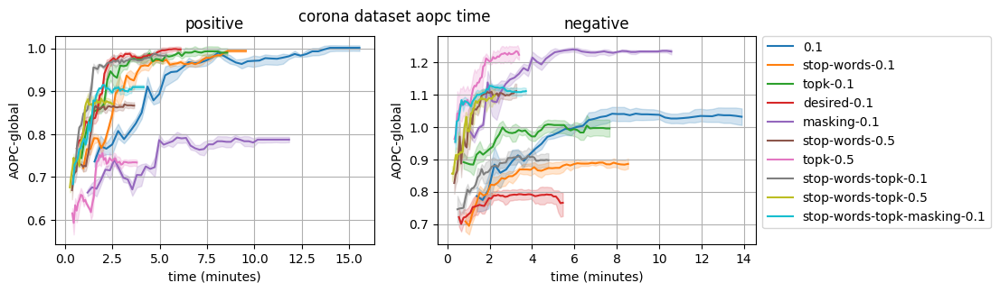

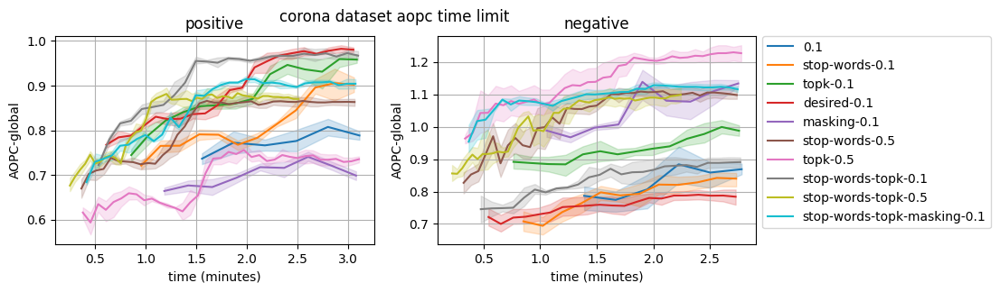

In [19]:
aopc.compare_all(verbose=False)

pos
0.1: ['hand', 'like', 'help', 'good', 'free', 'great', 'thank', 'safe', 'support', 'please', 'thanks', 'best', 'well', 'positive', 'love', 'safety', 'interesting', 'fresh', 'better', 'heroes', 'protect', 'care', 'confidence', 'nice', 'relief', 'hope', 'boost', 'save', 'energy', 'happy']
lossy-0.1: ['hand', 'like', 'help', 'good', 'free', 'thank', 'great', 'support', 'safe', 'please', 'thanks', 'best', 'well', 'love', 'positive', 'safety', 'fresh', 'better', 'interesting', 'relief', 'protect', 'confidence', 'heroes', 'hope', 'care', 'nice', 'boost', 'credit', 'increase', 'energy']
topk-0.1: ['hand', 'like', 'help', 'good', 'free', 'great', 'thank', 'safe', 'support', 'please', 'thanks', 'best', 'well', 'love', 'positive', 'better', 'safety', 'fresh', 'interesting', 'confidence', 'heroes', 'nice', 'protect', 'relief', 'hope', 'care', 'won', 'important', 'boost', 'credit']
desired-0.1: ['hand', 'like', 'help', 'good', 'please', 'safe', 'free', 'thank', 'support', 'great', 'thanks', 'w

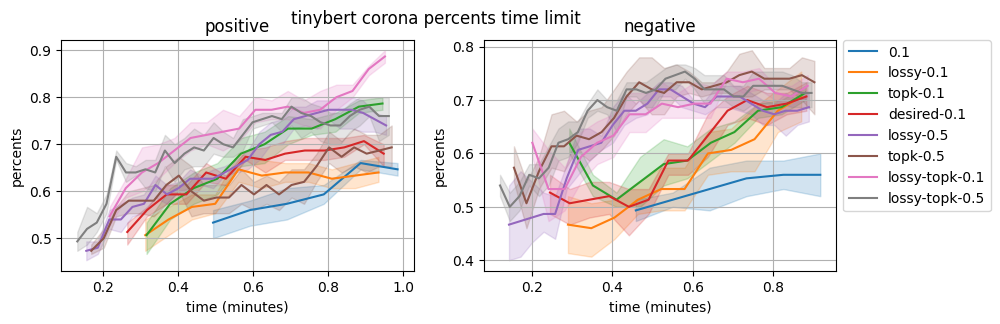

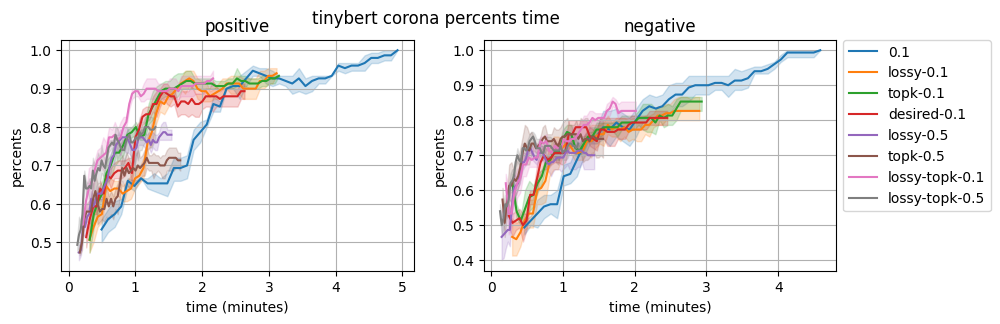

pos
0.1: ['hand', 'like', 'help', 'good', 'free', 'great', 'thank', 'safe', 'support', 'please', 'thanks', 'best', 'well', 'positive', 'love', 'safety', 'interesting', 'fresh', 'better', 'heroes', 'protect', 'care', 'confidence', 'nice', 'relief', 'hope', 'boost', 'save', 'energy', 'happy']
lossy-0.1: ['hand', 'like', 'help', 'good', 'free', 'thank', 'great', 'support', 'safe', 'please', 'thanks', 'best', 'well', 'love', 'positive', 'safety', 'fresh', 'better', 'interesting', 'relief', 'protect', 'confidence', 'heroes', 'hope', 'care', 'nice', 'boost', 'credit', 'increase', 'energy']
topk-0.1: ['hand', 'like', 'help', 'good', 'free', 'great', 'thank', 'safe', 'support', 'please', 'thanks', 'best', 'well', 'love', 'positive', 'better', 'safety', 'fresh', 'interesting', 'confidence', 'heroes', 'nice', 'protect', 'relief', 'hope', 'care', 'won', 'important', 'boost', 'credit']
desired-0.1: ['hand', 'like', 'help', 'good', 'please', 'safe', 'free', 'thank', 'support', 'great', 'thanks', 'w

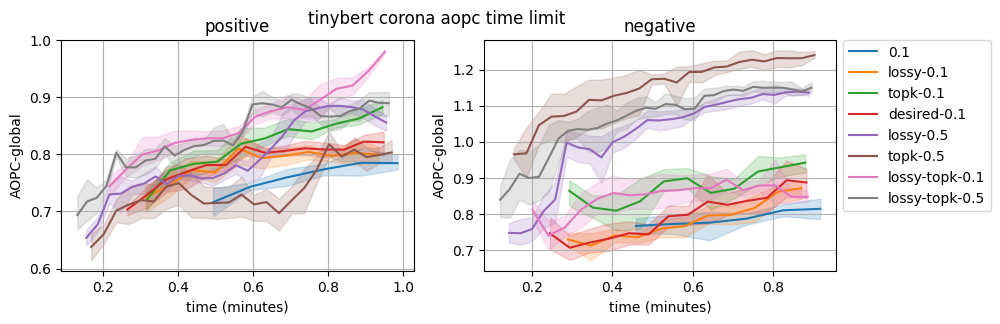

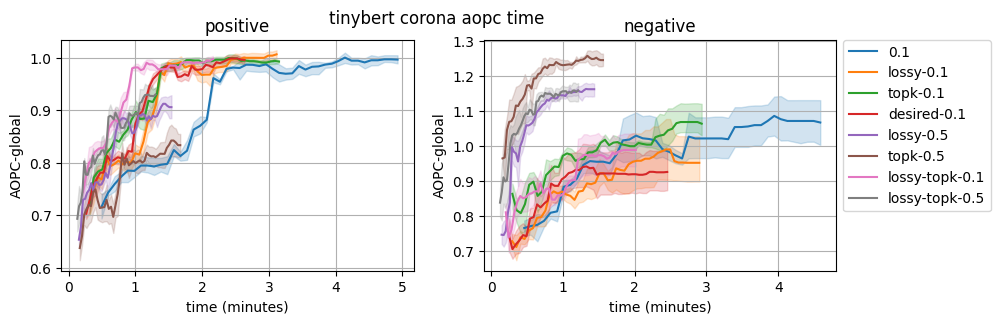

In [114]:
aopc.compare_all()

### masking

In [ ]:
# # when masking changing probability to 0.3
# path = f'results/masking/{model_type}/{ds_name}/{sorting}/'
# pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
# pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
# aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)
# aopc._compare_sorts('remove')

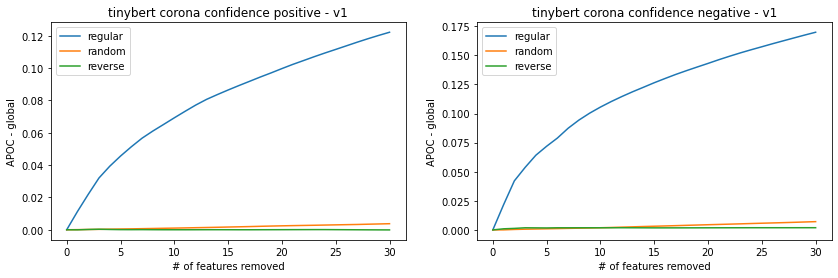

In [17]:
# when changing masking options to 50 instead of 500
masking_folder = f'results/masking_50/{model_type}/{ds_name}/{sorting}/'
pos_scores, neg_scores = ScoreUtils.get_scores_dict(masking_folder, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)
aopc._compare_sorts('remove')

In [ ]:
ds_name = 'corona'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/lossy-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [4]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

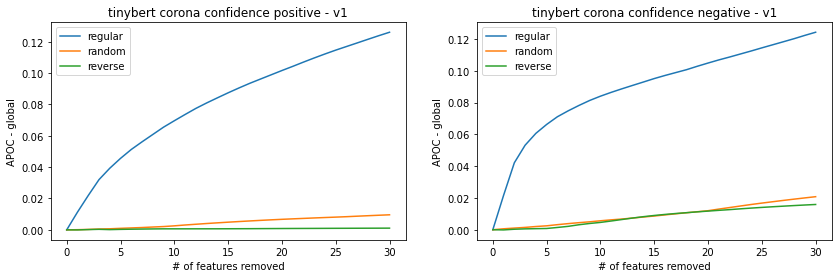

In [5]:
aopc._compare_sorts('remove')

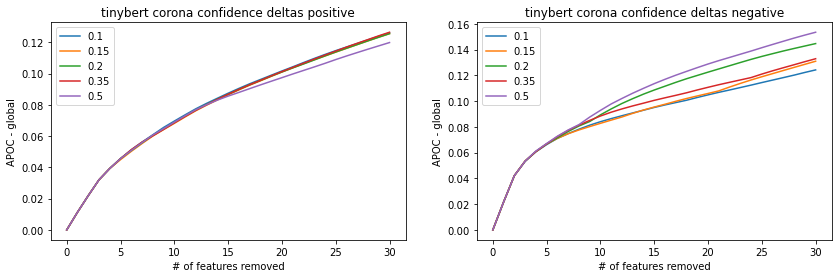

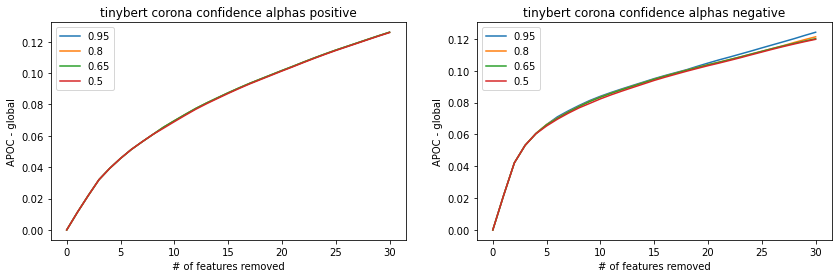

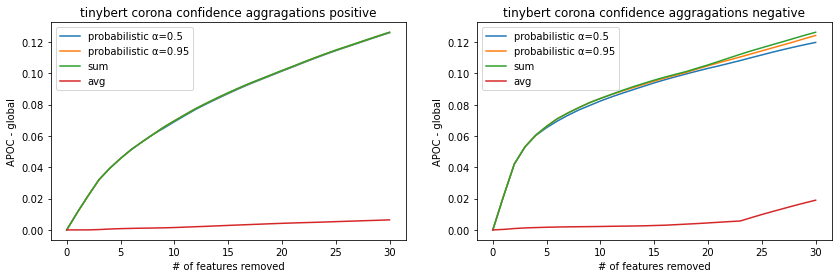

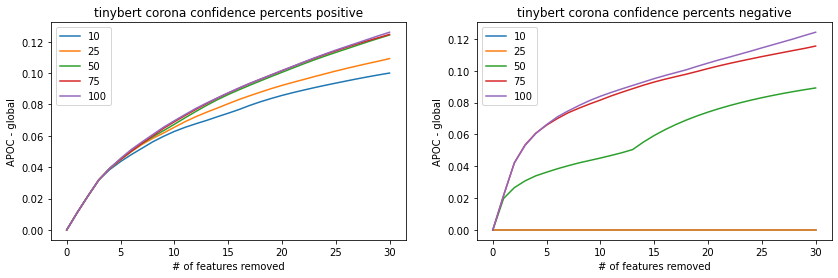

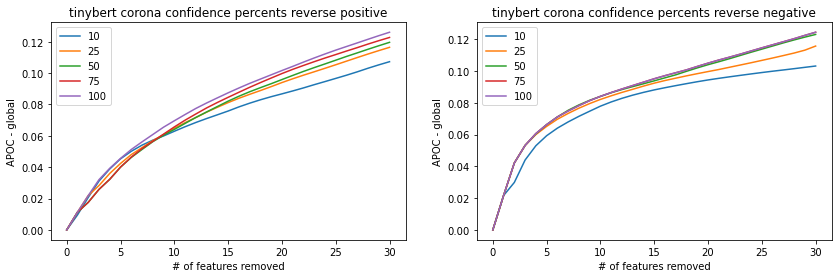

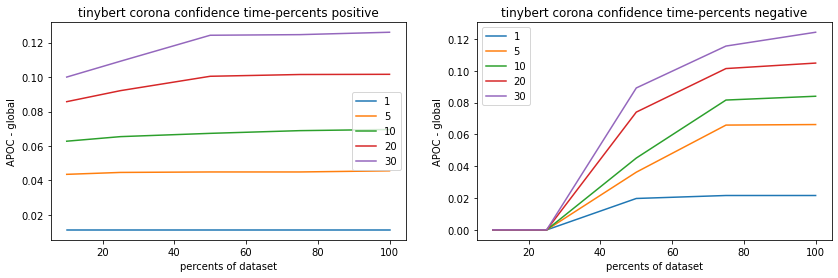

In [7]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

In [3]:
ds_name = 'corona'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/lossy-topk-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [4]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

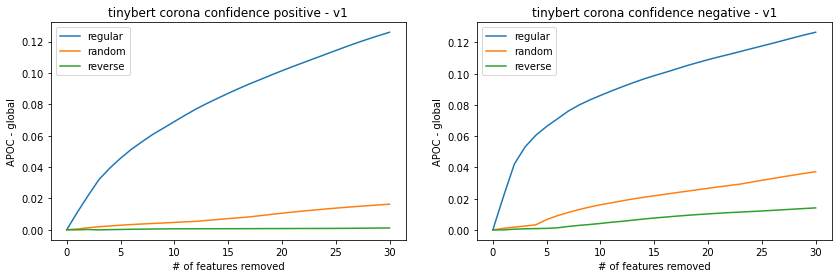

In [5]:
aopc._compare_sorts('remove')

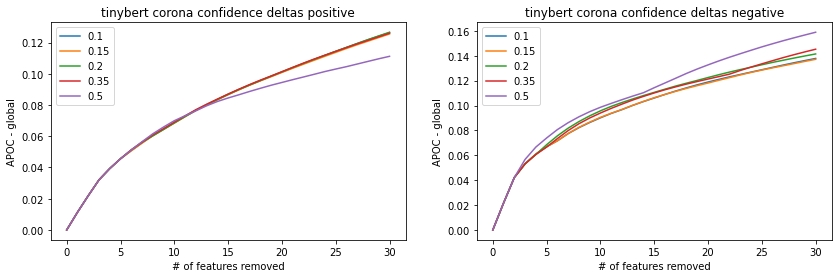

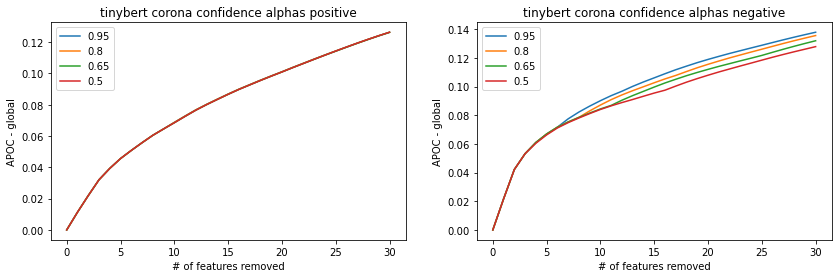

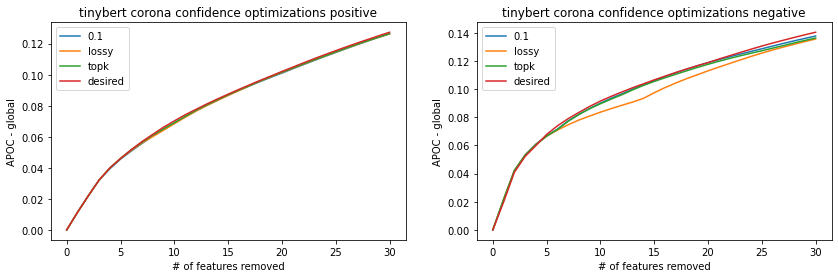

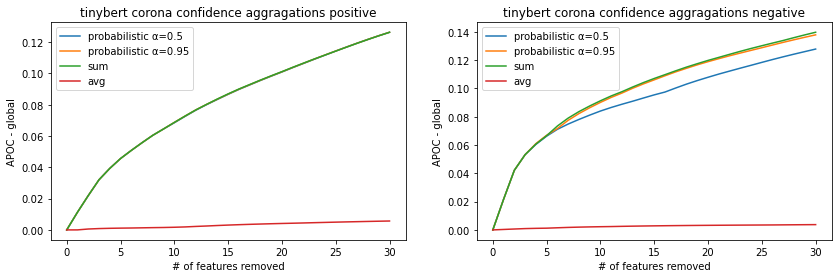

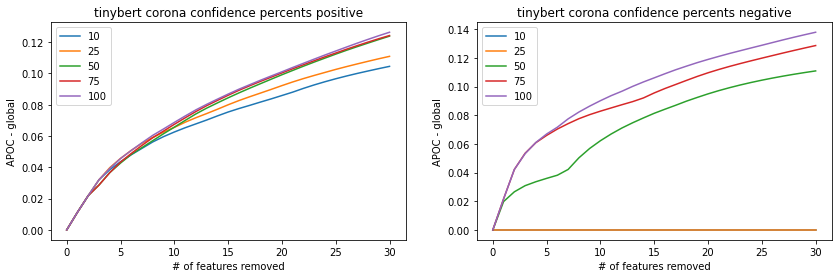

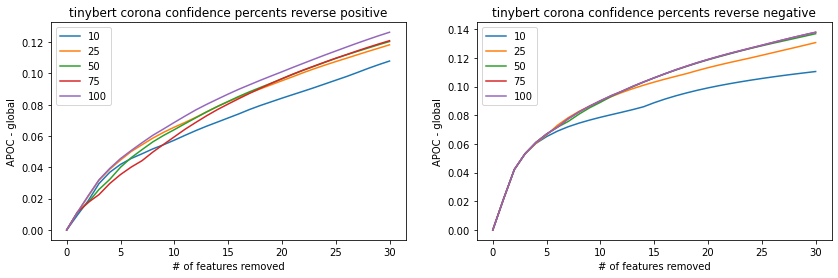

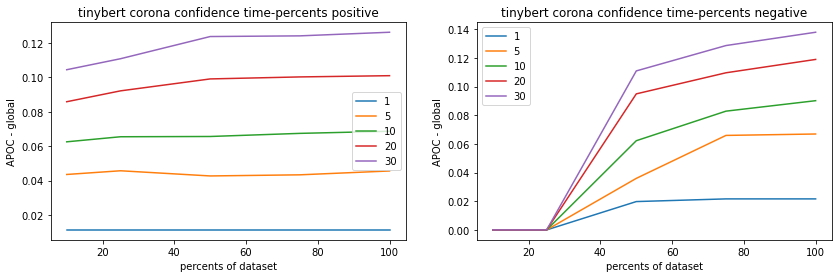

In [6]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

## Sentiment

In [26]:
ds_name = 'sentiment'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

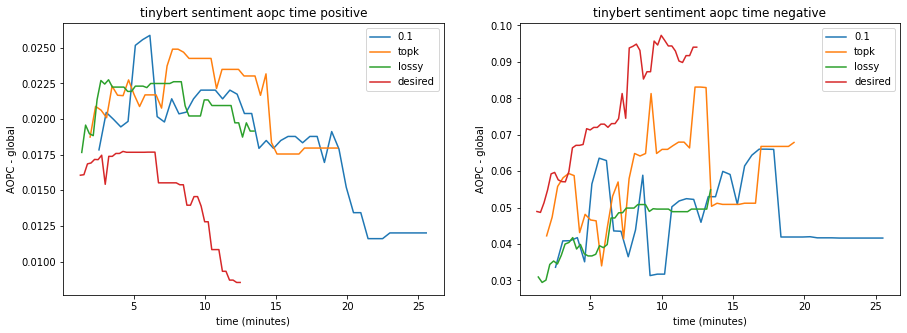

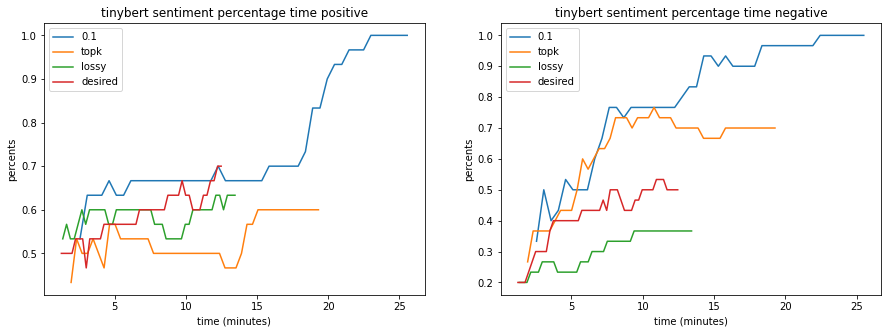

In [20]:
AOPC.time_aopc_monitor(path, title, model, model_type, ds_name, ['0.1', 'topk', 'lossy', 'desired'], tokenizer, anchor_examples, labels, top=30, alpha=0.95)
AOPC.time_percent_monitor(path, model_type, ds_name, ['0.1', 'topk', 'lossy', 'desired'], tokenizer, anchor_examples, labels, top=30, alpha=0.95)

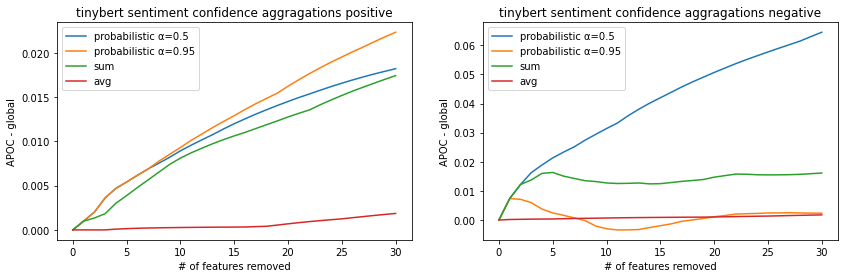

In [13]:
"""optimizations with δ=0.5""" 
cur_delta = 0.5
aggragations = ['', '', 'sum_', 'avg_']
alphas = [0.5, 0.95, None, None]
legends = ['probabilistic α=0.5', 'probabilistic α=0.95', 'sum', 'avg']
get_scores_fn = lambda x: ScoreUtils.get_scores_dict(path, path, trail_path = f"../{cur_delta}/{x[0]}scores.xlsx", alpha = x[1])
AOPC.compare_aopcs(model, tokenizer, zip(aggragations, alphas), get_scores_fn, anchor_examples, labels, legends, f'{title} aggragations', num_removes=30)

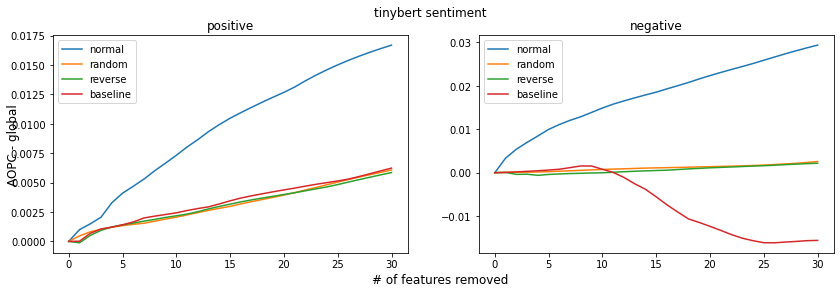

In [28]:
""" lossy aopc """
lossy_folder = f'results/{model_type}/{ds_name}/{sorting}/lossy'
pos_scores, neg_scores = ScoreUtils.get_scores_dict(lossy_folder, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)
aopc._compare_sorts('remove')

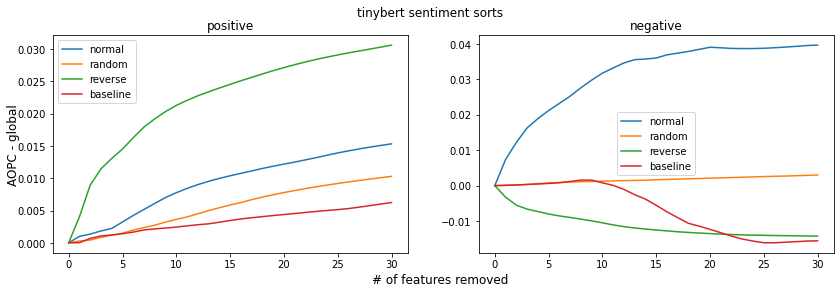

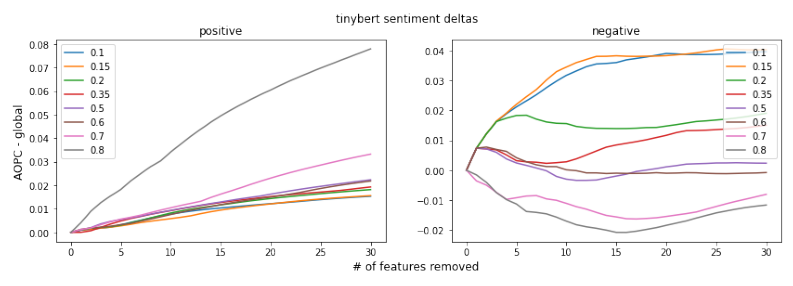

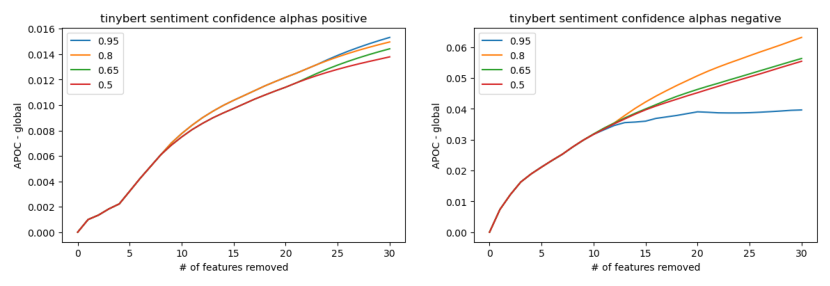

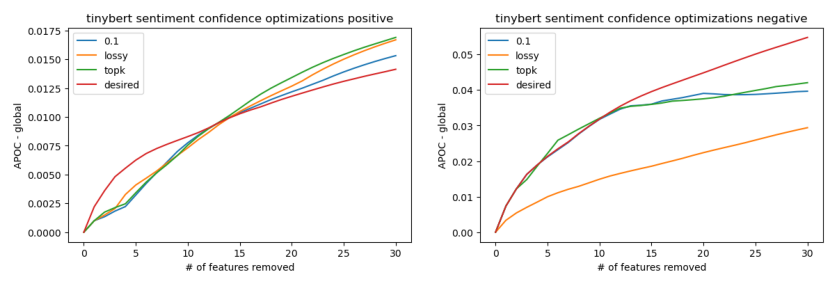

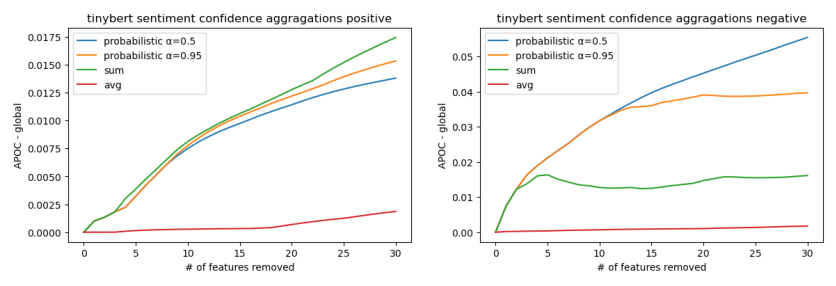

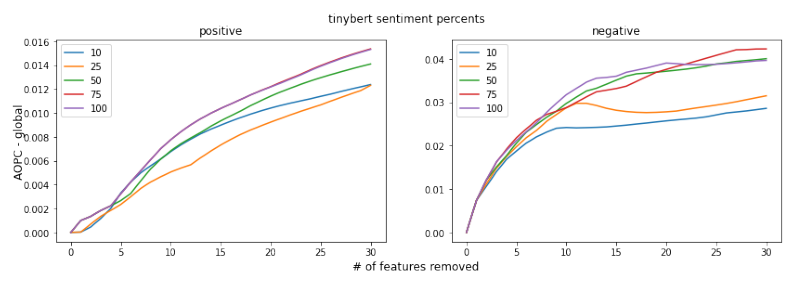

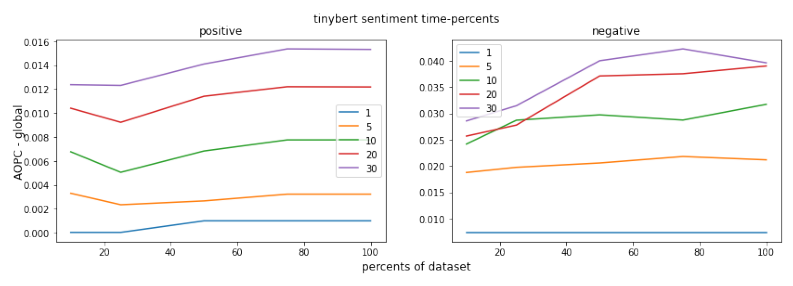

In [27]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

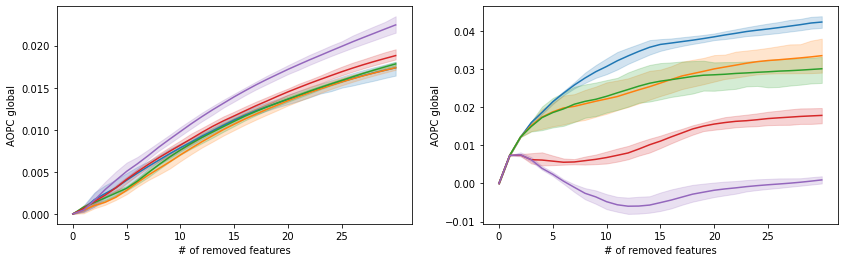

In [4]:
deltas = [0.1, 0.15, 0.2, 0.35, 0.5]
seeds = [42, 84, 126, 168, 210]
AOPC.compare_random_aopcs(path, model, tokenizer, seeds, deltas, anchor_examples, labels, deltas, f'{title} seeds deltas')

### masking

In [ ]:
# # when masking changing probability to 0.3
# path = f'results/masking/{model_type}/{ds_name}/{sorting}/'
# pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
# pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
# aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)
# aopc._compare_sorts('remove')

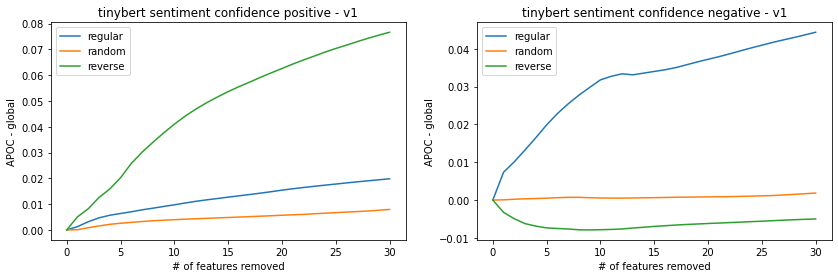

In [29]:
# when changing masking options to 50 instead of 500
path = f'results/masking_50/{model_type}/{ds_name}/{sorting}/'
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)
aopc._compare_sorts('remove')

In [3]:
ds_name = 'sentiment'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/lossy-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [9]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

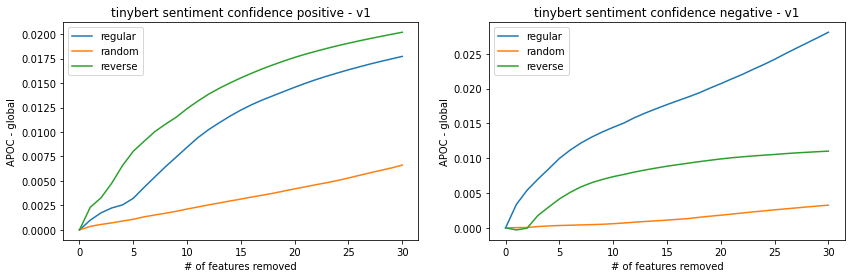

In [10]:
aopc._compare_sorts('remove')

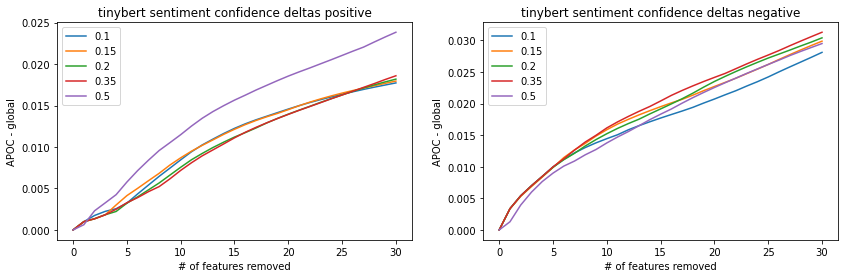

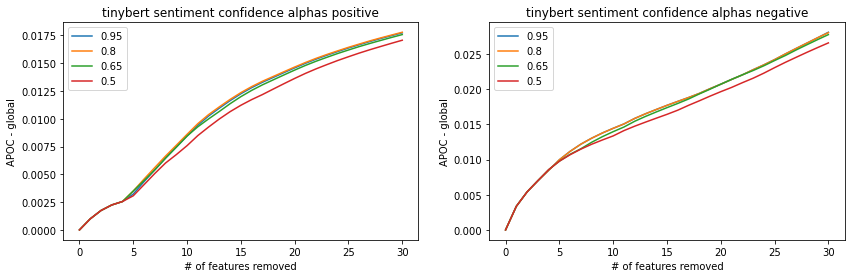

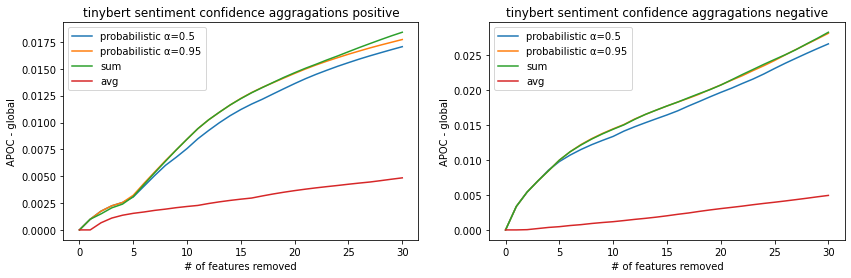

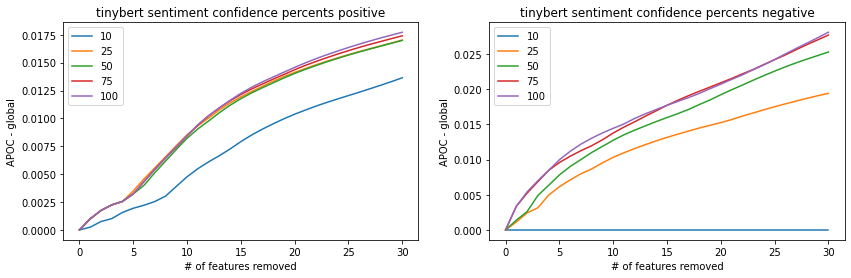

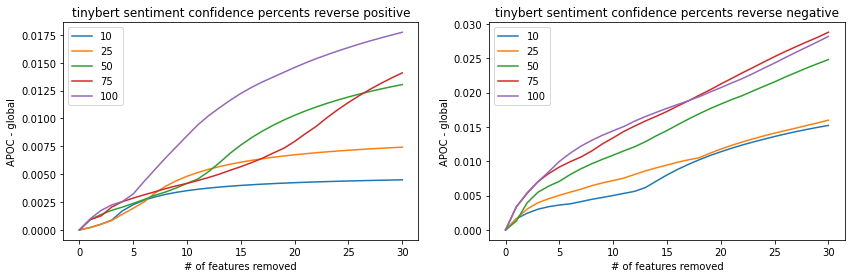

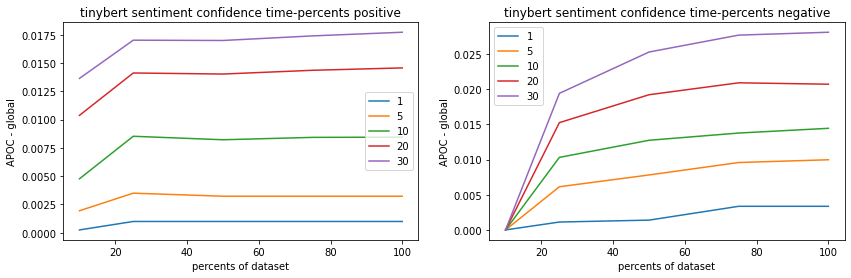

In [4]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

In [7]:
ds_name = 'sentiment'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/lossy-topk-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [8]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

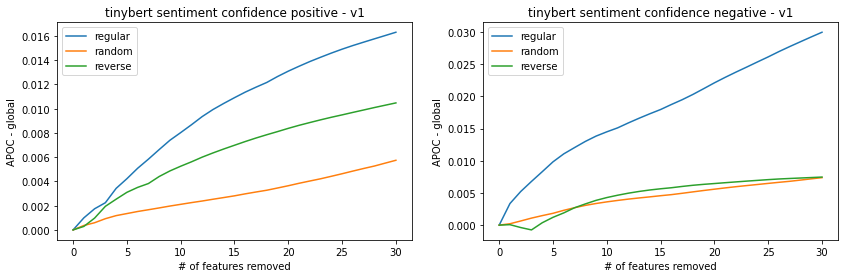

In [9]:
aopc._compare_sorts('remove')

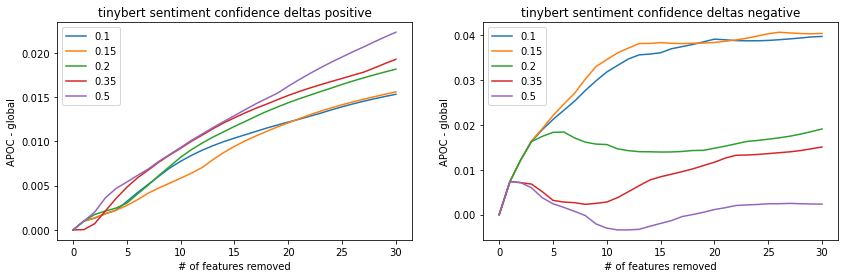

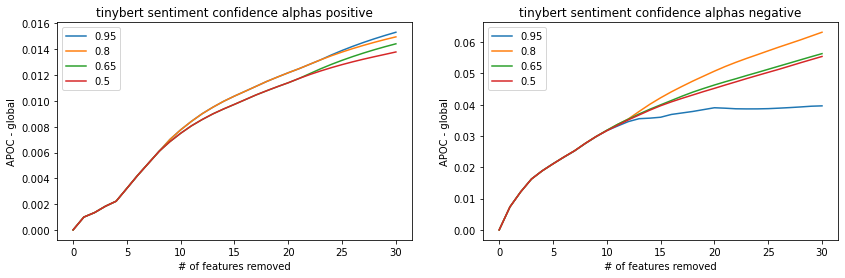

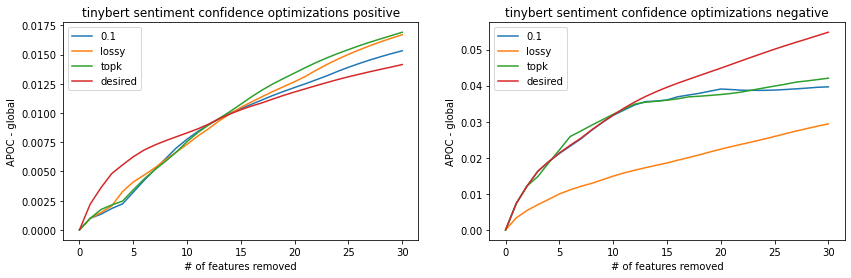

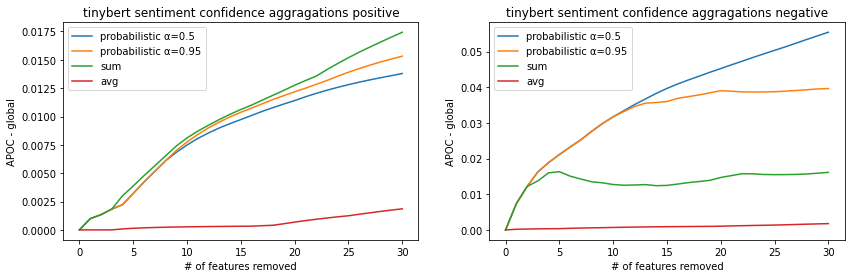

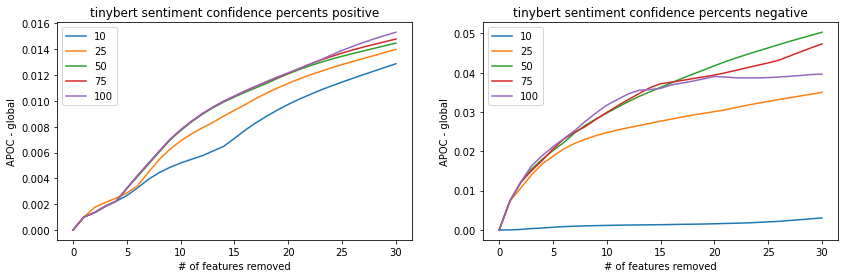

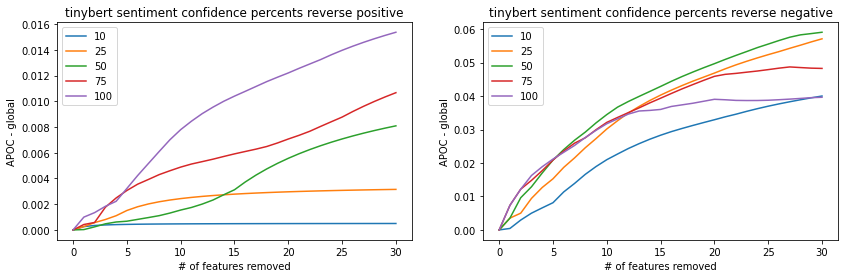

In [ ]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

## Dilemma Stopwords

In [25]:
ds_name = 'dilemma'
model_type = 'tinybert'
path = f'results/mp/{model_type}/{ds_name}/{sorting}/'
aopc = AOPC(path, tokenizer, base_opt = 'stop-words')

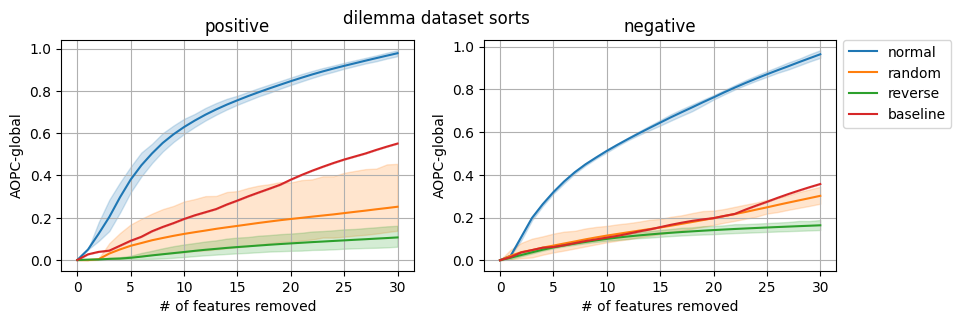

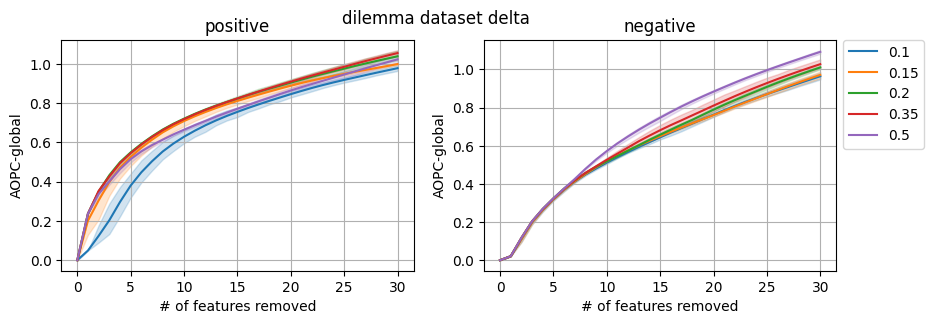

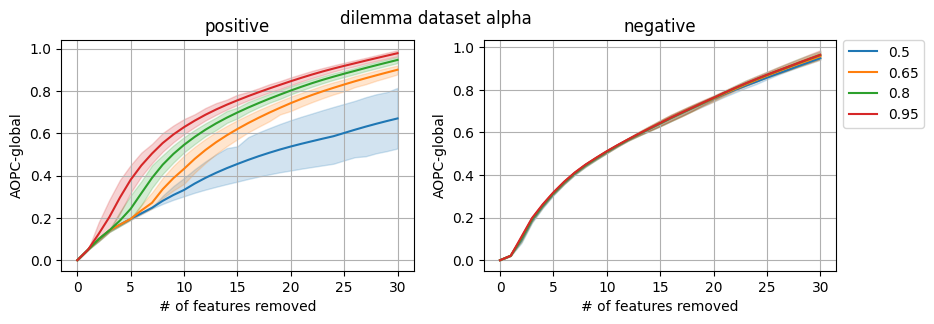

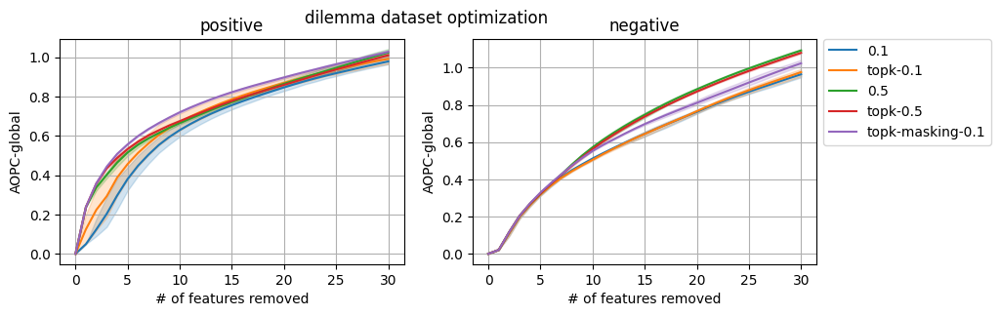

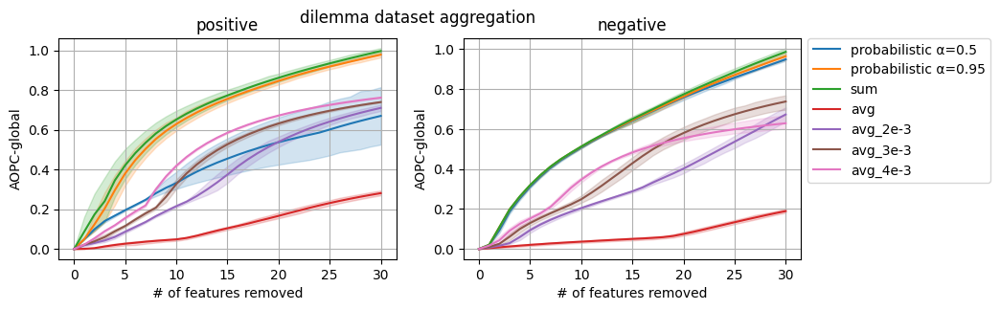

...

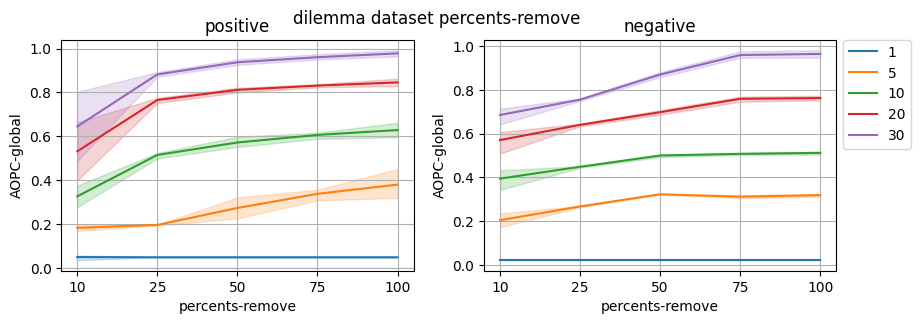

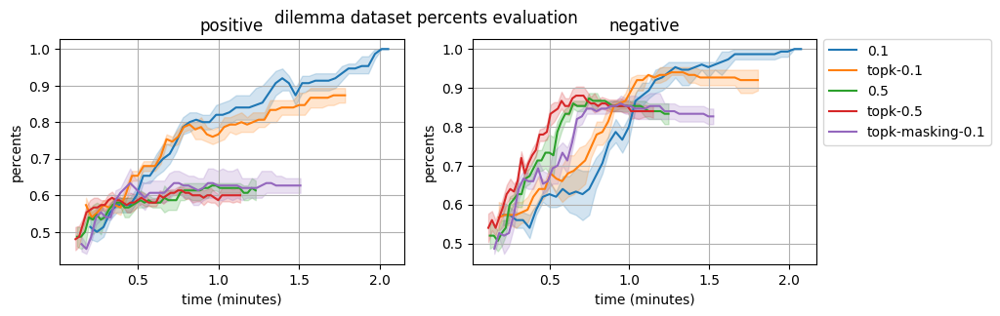

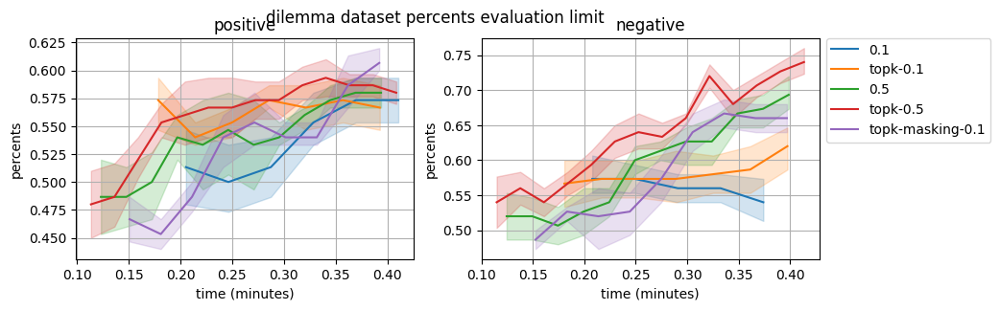

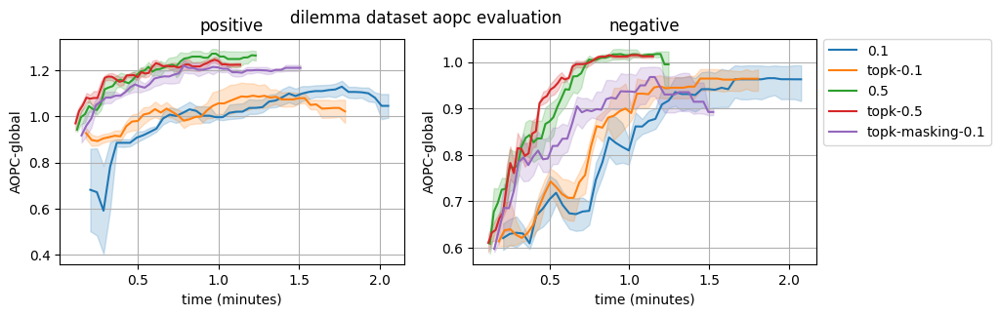

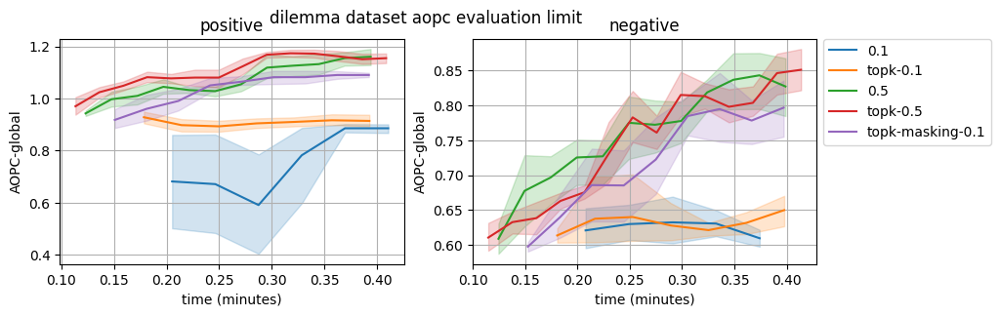

In [27]:
aopc.compare_all(verbose=False, from_img = ['sorts', 'delta', 'alpha'])

## Dilemma

In [24]:
ds_name = 'dilemma'
model_type = 'tinybert'
path = f'results/mp/{model_type}/{ds_name}/{sorting}/'
aopc = AOPC(path, tokenizer)

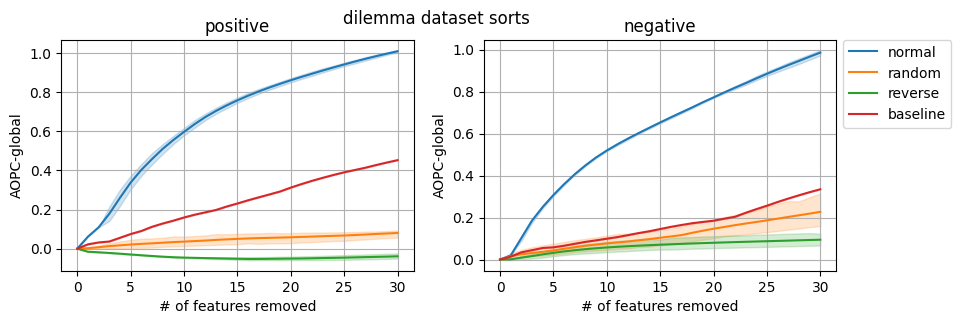

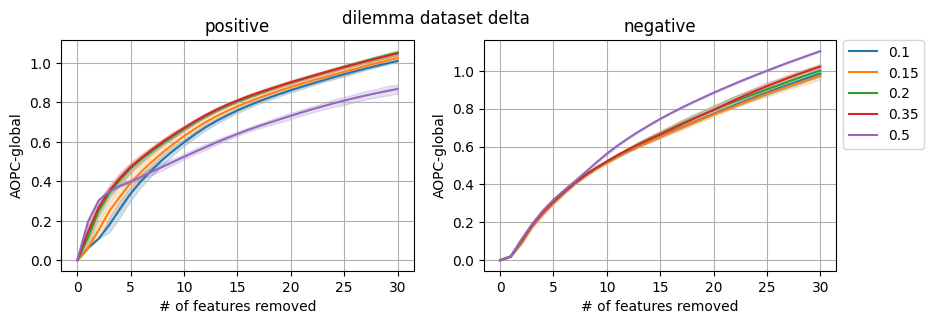

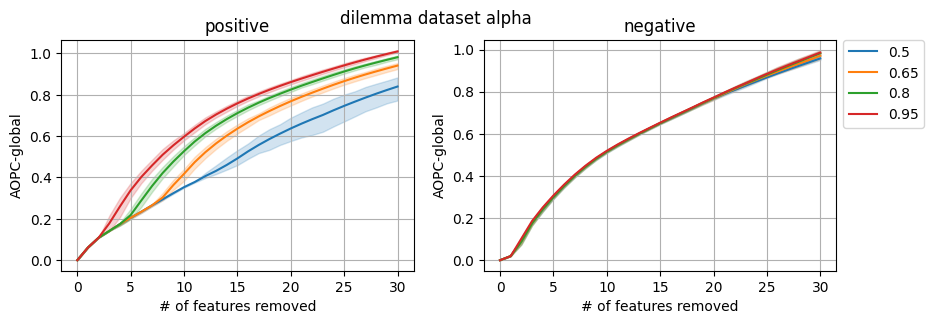

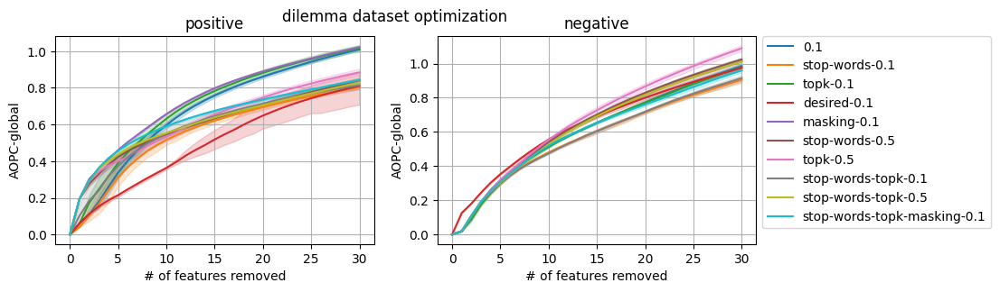

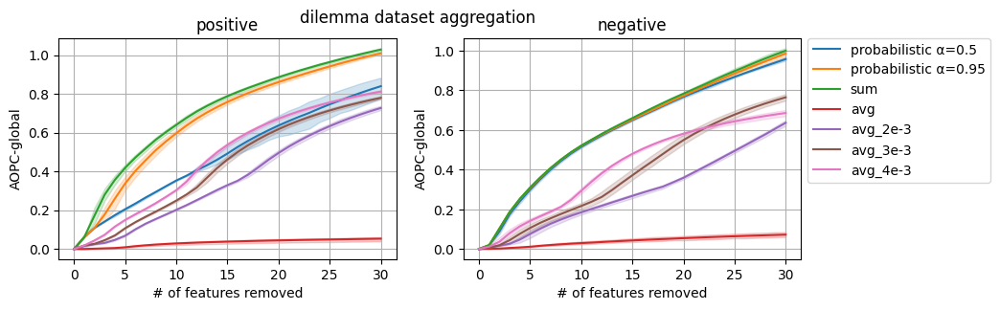

...

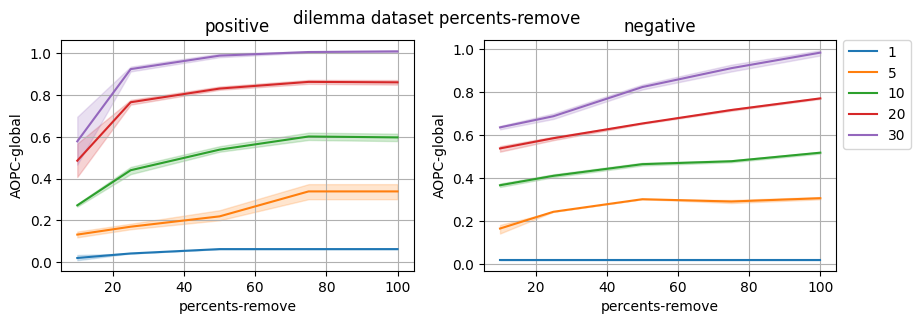

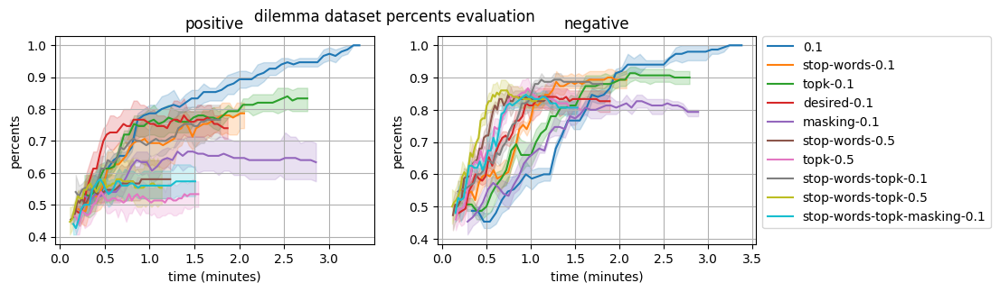

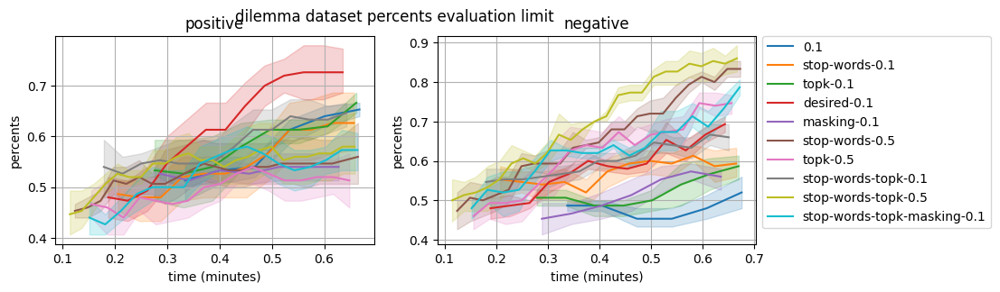

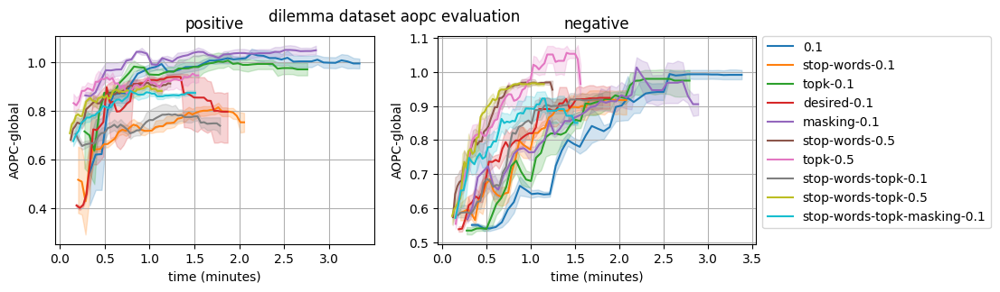

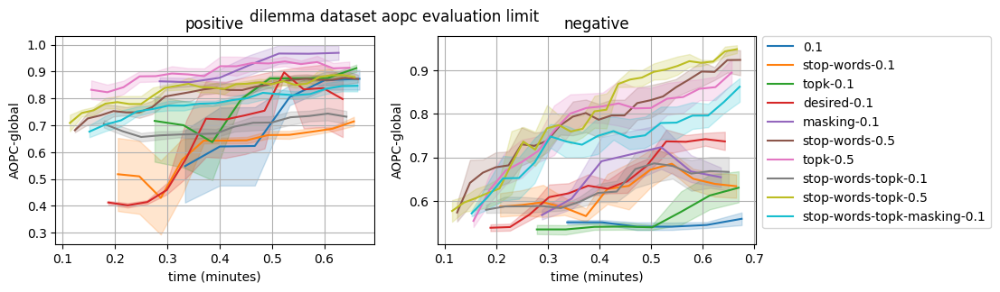

In [25]:
aopc.compare_all(verbose=False)

pos
0.1: ['more', 'great', 'interesting', 'social', 'important', 'good', 'best', 'own', 'most', 'amazing', 'better', '!', 'brilliant', 'thanks', 'excellent', 'powerful', 'wow', 'new', 'media', 'awesome', 'happy', 'love', 'first', 'fantastic', 'worth', 'many', 'greatest', 'incredible', 'perfect', 'okay']
lossy-0.1: ['great', 'good', 'social', 'interesting', 'important', 'best', 'amazing', 'better', 'brilliant', 'excellent', 'thanks', 'powerful', 'happy', 'wow', 'awesome', 'glad', 'perfect', 'many', 'media', 'greatest', 'favorite', 'incredible', 'huge', 'fantastic', '2020', 'love', 'first', 'new', 'true', 'really']
topk-0.1: ['more', 'great', 'interesting', 'good', 'social', 'important', 'best', 'most', 'amazing', 'own', '!', 'better', 'brilliant', 'excellent', 'thanks', 'happy', 'awesome', 'powerful', 'perfect', 'fantastic', 'fascinating', 'live', 'love', 'wow', 'real', 'greatest', 'nice', 'loved', 'goals', 'incredible']
desired-0.1: ['more', 'good', 'interesting', 'great', 'important',

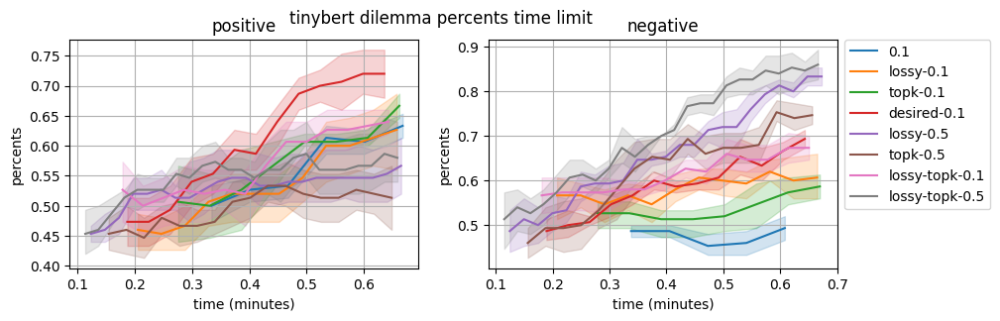

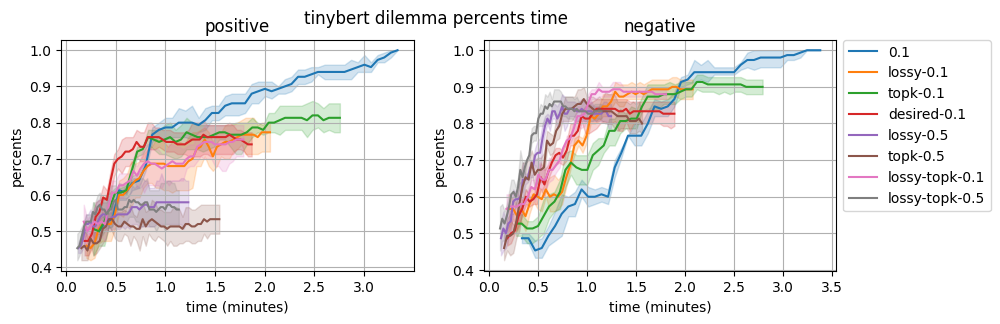

pos
0.1: ['more', 'great', 'interesting', 'social', 'important', 'good', 'best', 'own', 'most', 'amazing', 'better', '!', 'brilliant', 'thanks', 'excellent', 'powerful', 'wow', 'new', 'media', 'awesome', 'happy', 'love', 'first', 'fantastic', 'worth', 'many', 'greatest', 'incredible', 'perfect', 'okay']
lossy-0.1: ['great', 'good', 'social', 'interesting', 'important', 'best', 'amazing', 'better', 'brilliant', 'excellent', 'thanks', 'powerful', 'happy', 'wow', 'awesome', 'glad', 'perfect', 'many', 'media', 'greatest', 'favorite', 'incredible', 'huge', 'fantastic', '2020', 'love', 'first', 'new', 'true', 'really']
topk-0.1: ['more', 'great', 'interesting', 'good', 'social', 'important', 'best', 'most', 'amazing', 'own', '!', 'better', 'brilliant', 'excellent', 'thanks', 'happy', 'awesome', 'powerful', 'perfect', 'fantastic', 'fascinating', 'live', 'love', 'wow', 'real', 'greatest', 'nice', 'loved', 'goals', 'incredible']
desired-0.1: ['more', 'good', 'interesting', 'great', 'important',

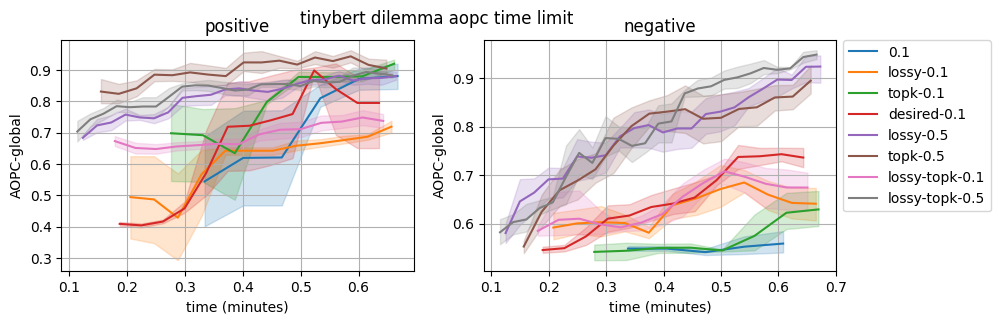

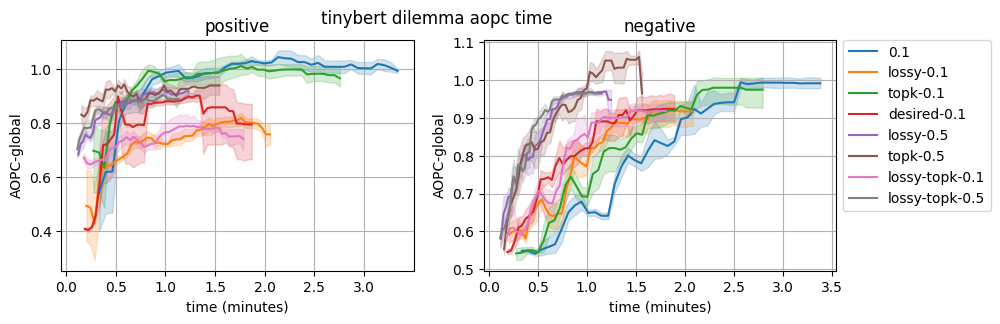

In [111]:
aopc.compare_all()

### masking

In [ ]:
# # when masking changing probability to 0.3
# path = f'results/masking/{model_type}/{ds_name}/{sorting}/'
# pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
# pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
# aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)
# aopc._compare_sorts('remove')

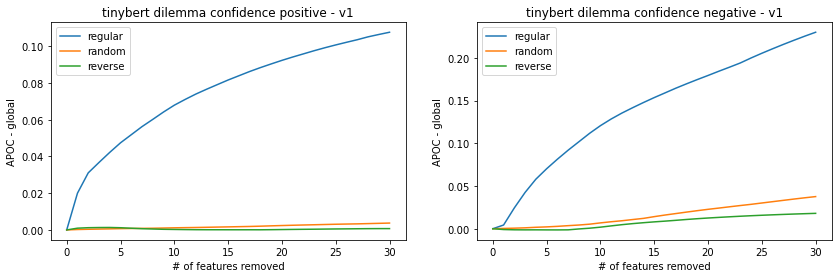

In [8]:
# when changing masking options to 50 instead of 500
path = f'results/masking_50/{model_type}/{ds_name}/{sorting}/'
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)
aopc._compare_sorts('remove')

In [5]:
ds_name = 'dilemma'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/lossy-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [6]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

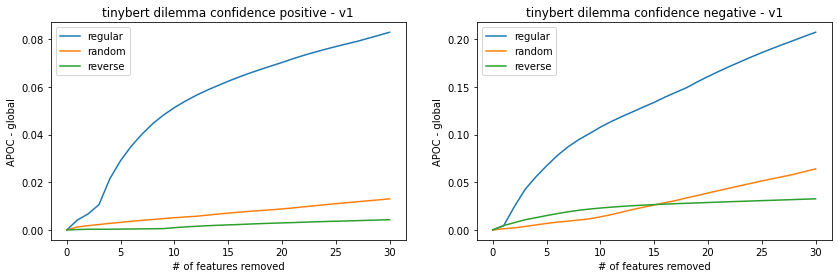

In [7]:
aopc._compare_sorts('remove')

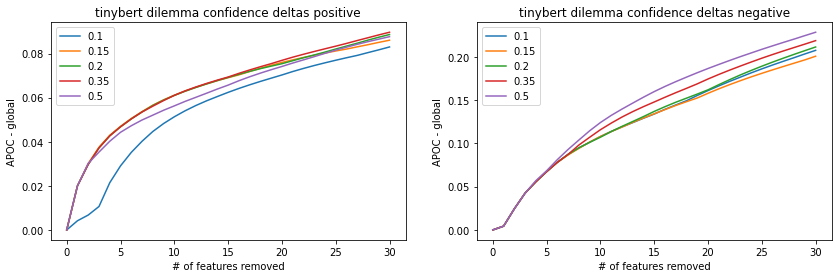

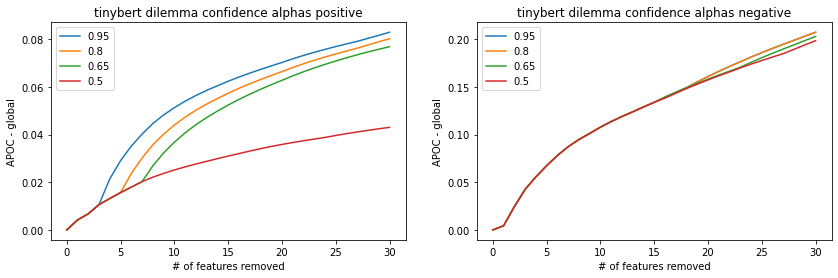

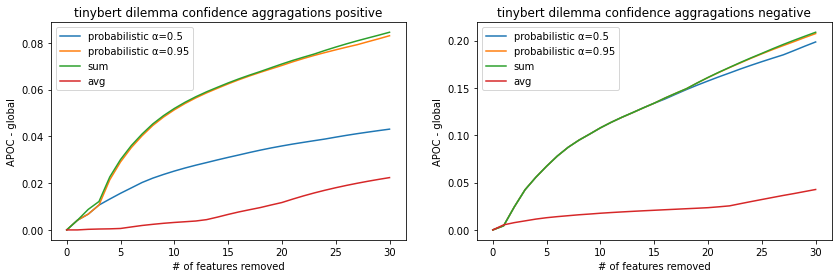

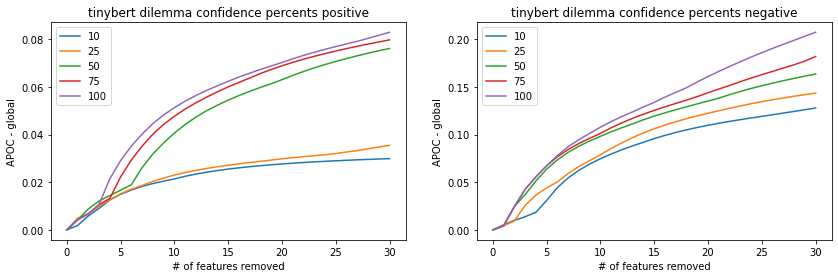

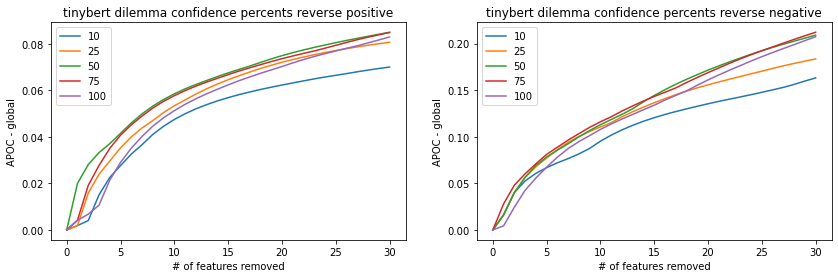

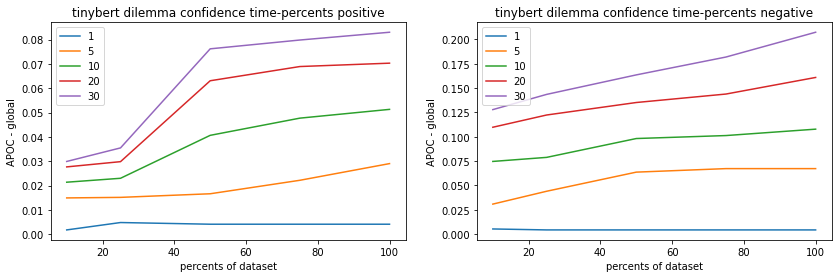

In [8]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

In [3]:
ds_name = 'dilemma'
model_type = 'tinybert'
path = f'results/{model_type}/{ds_name}/{sorting}/lossy-topk-{delta}'
anchor_examples, labels, model, title = prepare(ds_name, model_type, path)

In [4]:
pos_scores, neg_scores = ScoreUtils.get_scores_dict(path, trail_path = "scores.xlsx")
pos_tokens, neg_tokens = list(pos_scores.keys()), list(neg_scores.keys())
aopc = AOPC(model, tokenizer, anchor_examples, labels, pos_tokens, neg_tokens, title)

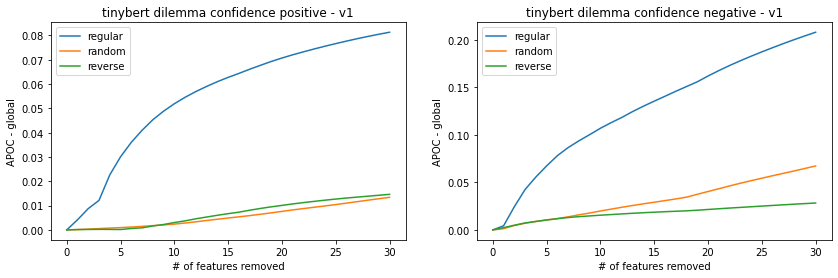

In [5]:
aopc._compare_sorts('remove')

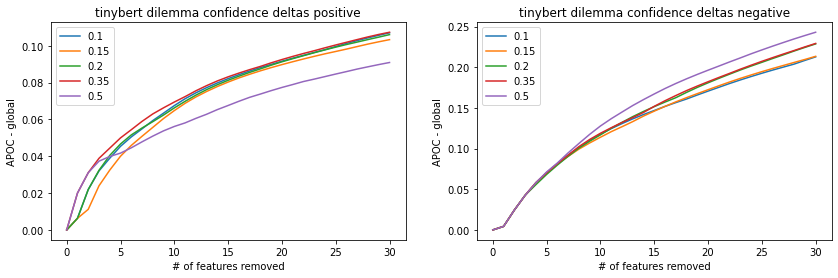

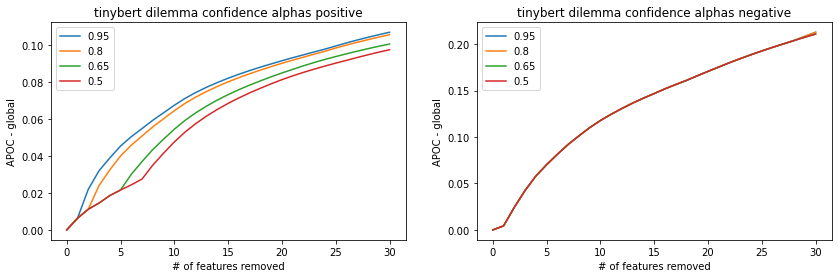

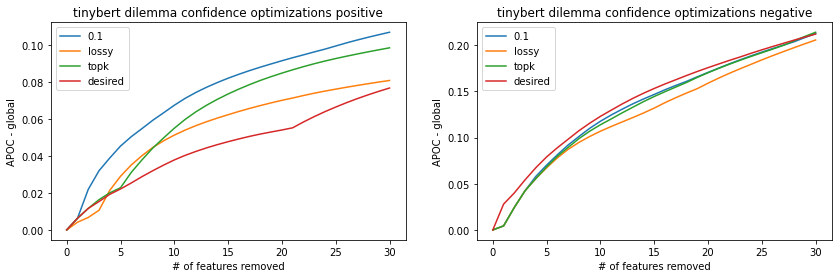

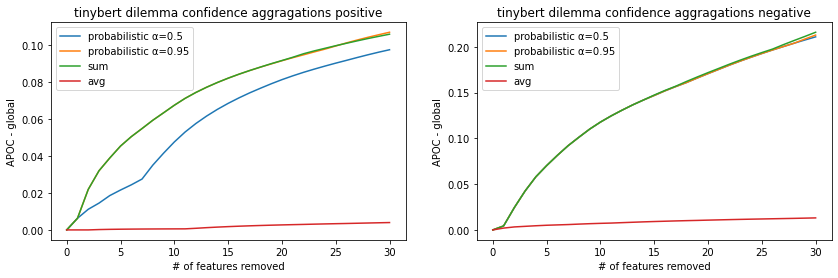

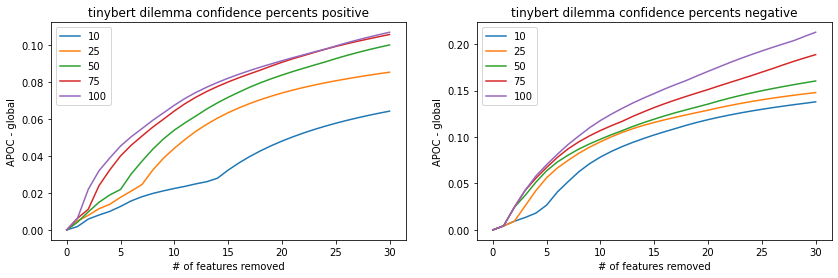

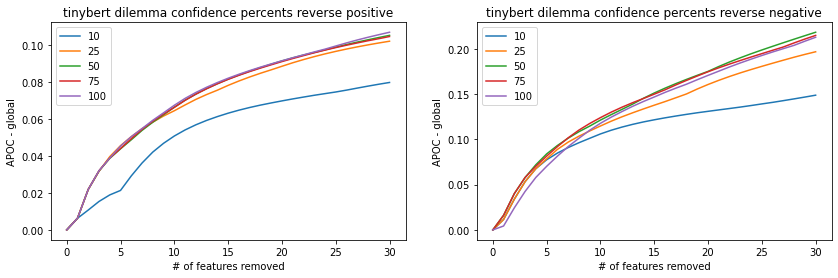

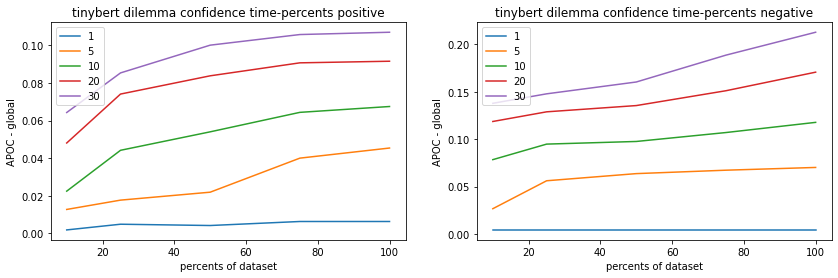

In [6]:
AOPC.compare_all(path, model, tokenizer, anchor_examples, labels, title)

## Toy-Spam stop-words min_5

In [3]:
ds_name = 'toy-spam'
model_type = 'tinybert'
path = f'results/mp/{model_type}/{ds_name}/{sorting}/'
aopc = AOPC(path, tokenizer, base_opt = 'stop-words')

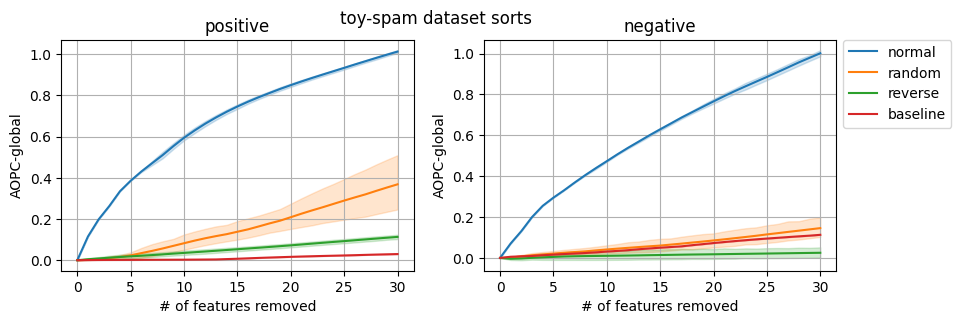

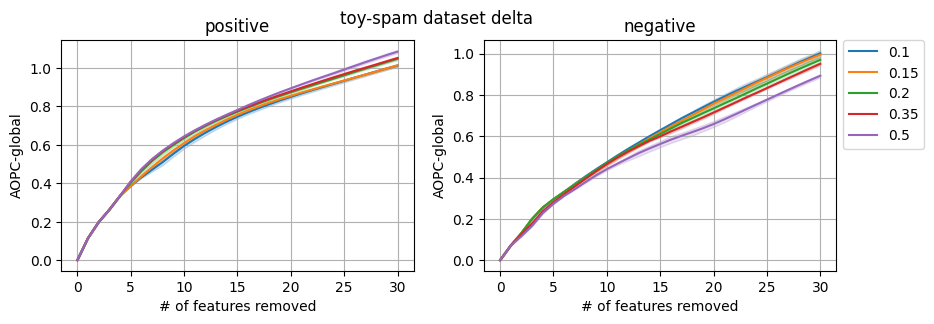

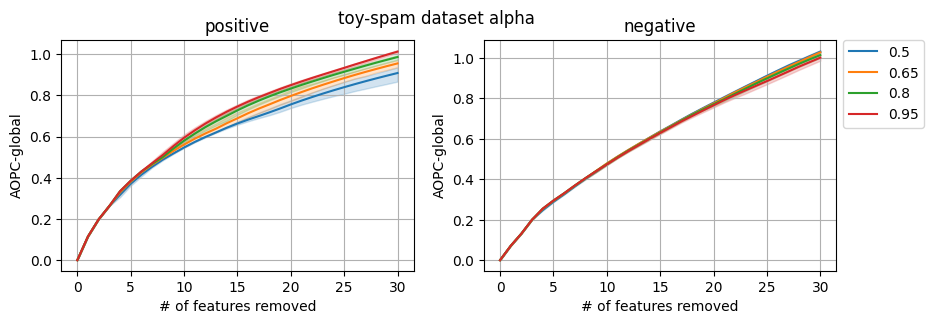

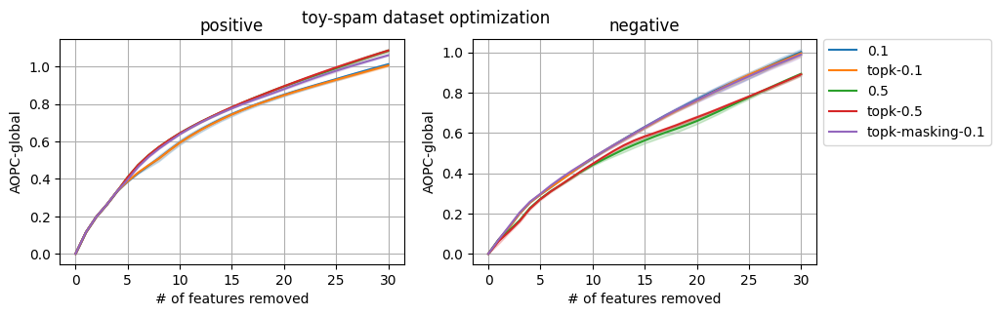

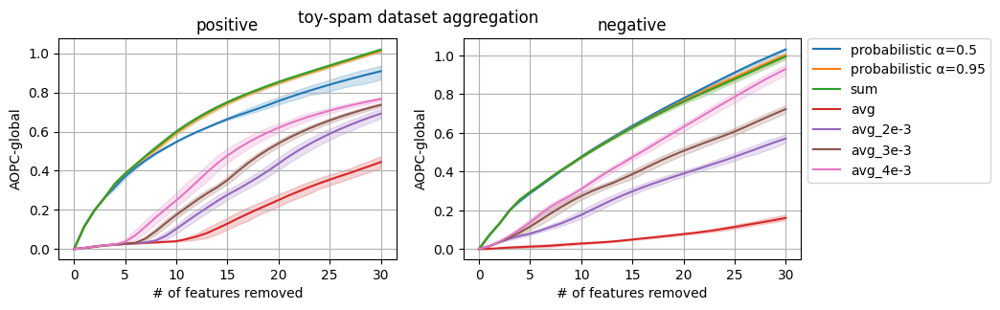

...

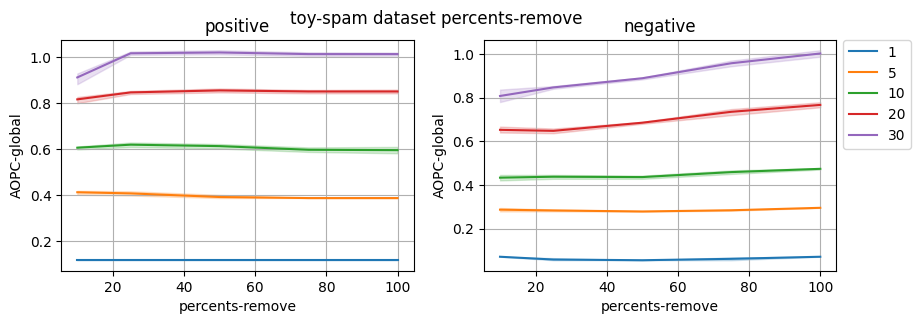

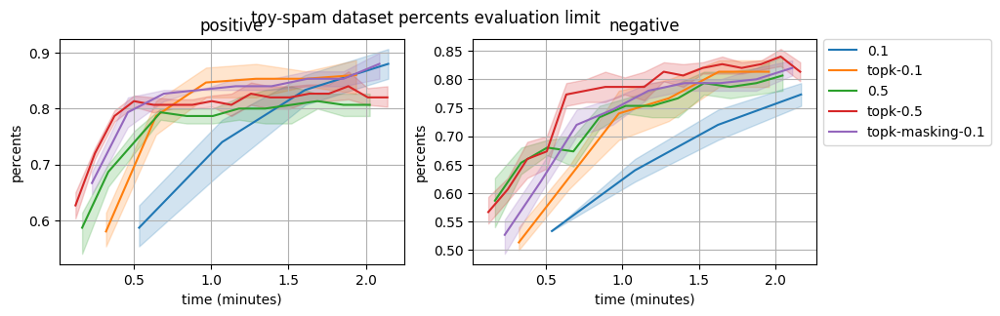

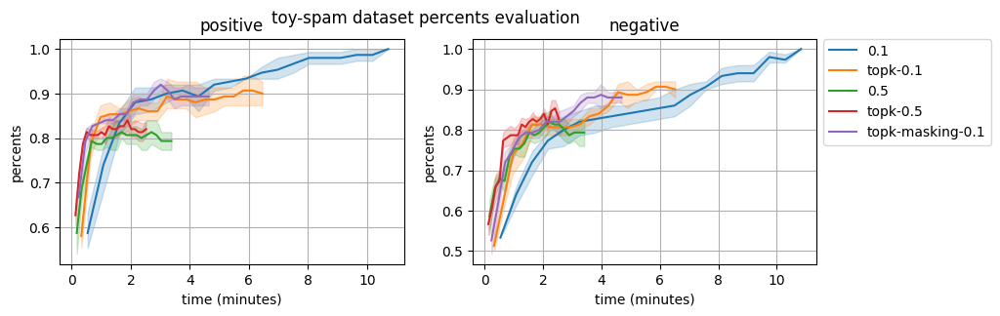

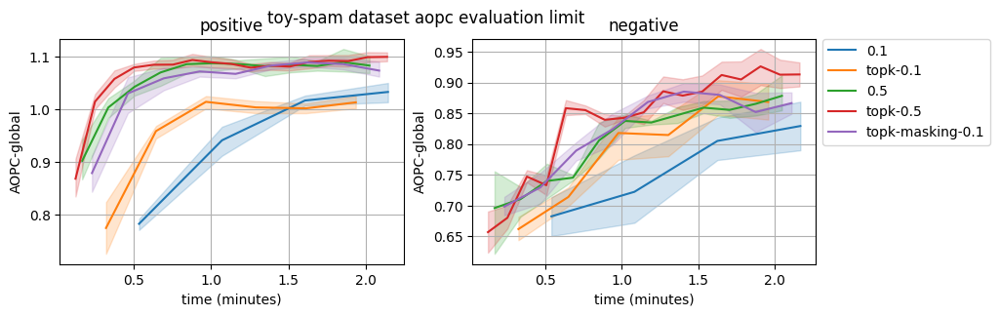

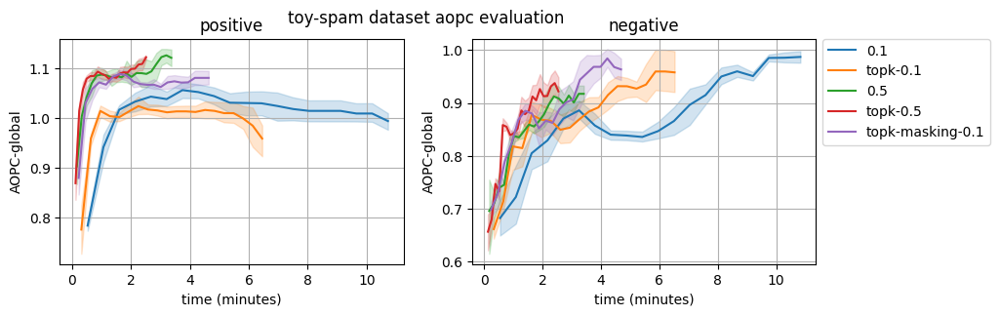

In [4]:
aopc.compare_all(verbose=False)

pos
normal: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']
random: ['family', 'fantastic', 'cute', 'classic', 'pleased', 'perfect', 'grandchildren', 'children', 'excellent', 'fun']
reverse: ['kids', 'year', 'games', 'book', 'birthday', 'glad', 'favorites', 'enjoys', 'adorable', 'playing']
baseline: ['teaches', 'bring', 'introduced', 'parties', 'grandparents', 'childhood', 'complex', 'sequence', 'trips', 'conversation']

neg
normal: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'cheap', 'product', 'money', 'thought']
random: ['wrong', 'x', 'ridiculous', 'less', 'junk', 'weight', '34', 'seems', 'garbage', 'pressure']
reverse: ['recommend', 'set', 'purchase', 'right', 'different', 'bigger', 'away', 'sent', 'said', 'took']
baseline: ['hole', 'seam', 'garbage', 'weak', 'balloon', 'returned', 'trash', 'cracked', 'float', 'leak']


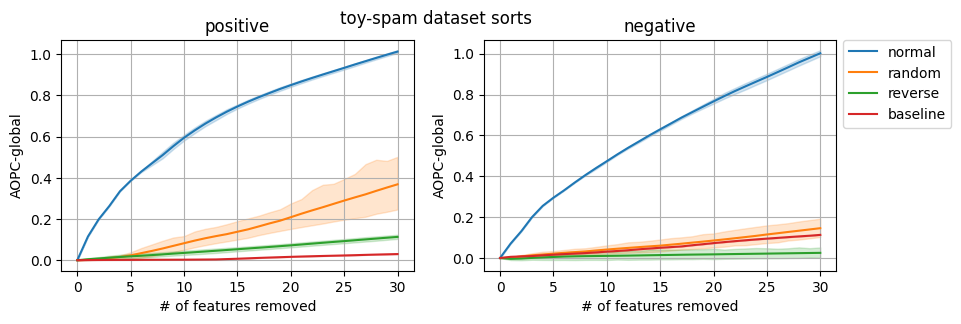

pos
0.1: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']
0.15: ['great', 'love', 'loves', 'fun', 'favorite', 'loved', 'awesome', 'wonderful', 'game', 'perfect']
0.2: ['great', 'love', 'loves', 'fun', 'loved', 'game', 'favorite', 'awesome', 'wonderful', 'excellent']
0.35: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'awesome', 'wonderful', 'friends']
0.5: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'awesome', 'friends', 'christmas']

neg
0.1: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'cheap', 'product', 'money', 'thought']
0.15: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'thought', 'product', 'cheap', 'item']
0.2: ['small', 'broke', 'disappointed', 'would', 'waste', 'product', 'smaller', 'thought', 'cheap', 'item']
0.35: ['small', 'broke', 'would', 'disappointed', 'waste', 'cheap', 'thought', 'smaller', 'product', 'money']
0.5: ['small', 'would', 'broke', 'di

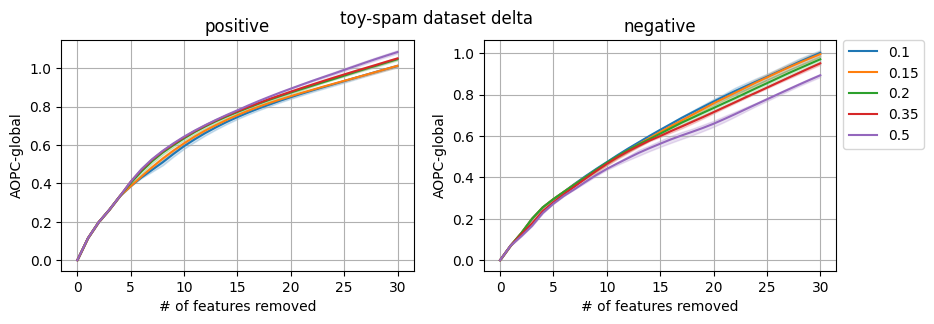

pos
0.95: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']
0.8: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']
0.65: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'perfect', 'classic']
0.5: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'awesome', 'friends', 'christmas']

neg
0.95: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'cheap', 'product', 'money', 'thought']
0.8: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'cheap', 'thought', 'money', 'product']
0.65: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'cheap', 'thought', 'money', 'product']
0.5: ['small', 'would', 'broke', 'disappointed', 'waste', 'product', 'money', 'thought', 'cheap', 'like']


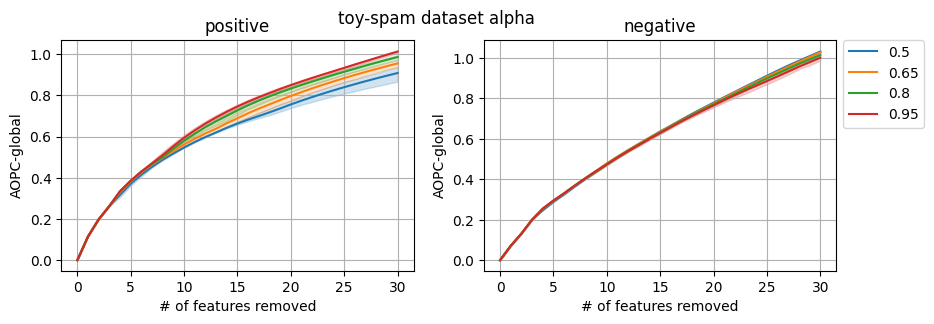

pos
0.1: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']
topk-0.1: ['great', 'love', 'loves', 'fun', 'favorite', 'loved', 'awesome', 'wonderful', 'game', 'perfect']
0.5: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'awesome', 'friends', 'christmas']
topk-0.5: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'friends', 'awesome', 'christmas']
topk-masking-0.1: ['great', 'love', 'loves', 'fun', 'loved', 'game', 'favorite', 'friends', 'perfect', 'awesome']

neg
0.1: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'cheap', 'product', 'money', 'thought']
topk-0.1: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'thought', 'cheap', 'product', 'plastic']
0.5: ['small', 'would', 'broke', 'disappointed', 'waste', 'product', 'money', 'thought', 'cheap', 'like']
topk-0.5: ['would', 'small', 'broke', 'disappointed', 'waste', 'product', 'money', 'work', 'cheap', 'thought']
topk-masking-

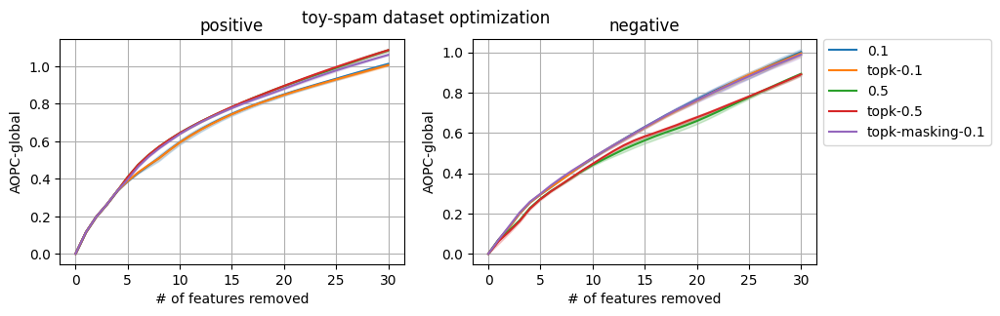

pos
probabilistic α=0.5: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'classic', 'perfect']
probabilistic α=0.95: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']
sum: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'game', 'wonderful', 'loved', 'perfect']
avg: ['wonderful', 'awesome', 'amazing', 'fantastic', 'favorite', 'enjoyable', 'classic', 'favorites', 'excellent', 'thank']
avg_2e-3: ['wonderful', 'awesome', 'amazing', 'favorite', 'enjoyable', 'classic', 'excellent', 'thank', 'great', 'love']
avg_3e-3: ['wonderful', 'awesome', 'amazing', 'favorite', 'classic', 'excellent', 'thank', 'great', 'love', 'loves']
avg_4e-3: ['wonderful', 'awesome', 'favorite', 'classic', 'excellent', 'great', 'love', 'loves', 'best', 'perfect']

neg
probabilistic α=0.5: ['small', 'broke', 'disappointed', 'waste', 'would', 'smaller', 'cheap', 'thought', 'money', 'poor']
probabilistic α=0.95: ['small', 'broke', 'dis

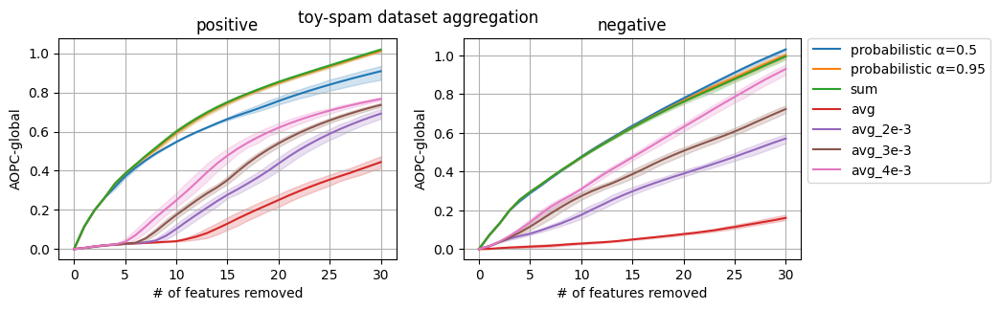

pos
10: ['great', 'love', 'fun', 'game', 'awesome', 'favorite', 'loves', 'wonderful', 'best', 'family']
25: ['great', 'love', 'fun', 'loves', 'game', 'favorite', 'awesome', 'wonderful', 'loved', 'best']
50: ['great', 'love', 'loves', 'fun', 'favorite', 'game', 'awesome', 'loved', 'wonderful', 'classic']
75: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'loved', 'game', 'wonderful', 'classic']
100: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']

neg
10: ['small', 'disappointed', 'broke', 'would', 'apart', 'waste', 'cheap', 'plastic', 'work', 'broken']
25: ['broke', 'small', 'would', 'disappointed', 'waste', 'cheap', 'plastic', 'apart', 'money', 'item']
50: ['broke', 'disappointed', 'small', 'waste', 'would', 'money', 'work', 'cheap', 'product', 'item']
75: ['small', 'broke', 'disappointed', 'waste', 'would', 'money', 'cheap', 'product', 'work', 'poor']
100: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'chea

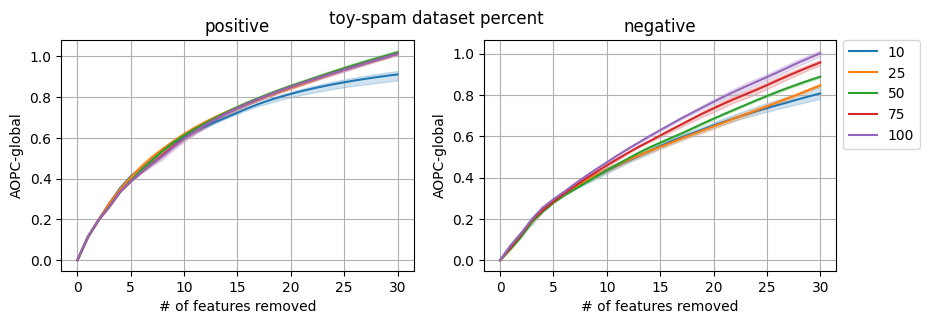

pos
10: ['great', 'love', 'fun', 'game', 'awesome', 'favorite', 'loves', 'wonderful', 'best', 'family']
25: ['great', 'love', 'fun', 'loves', 'game', 'favorite', 'awesome', 'wonderful', 'loved', 'best']
50: ['great', 'love', 'loves', 'fun', 'favorite', 'game', 'awesome', 'loved', 'wonderful', 'classic']
75: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'loved', 'game', 'wonderful', 'classic']
100: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']

neg
10: ['small', 'disappointed', 'broke', 'would', 'apart', 'waste', 'cheap', 'plastic', 'work', 'broken']
25: ['broke', 'small', 'would', 'disappointed', 'waste', 'cheap', 'plastic', 'apart', 'money', 'item']
50: ['broke', 'disappointed', 'small', 'waste', 'would', 'money', 'work', 'cheap', 'product', 'item']
75: ['small', 'broke', 'disappointed', 'waste', 'would', 'money', 'cheap', 'product', 'work', 'poor']
100: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'chea

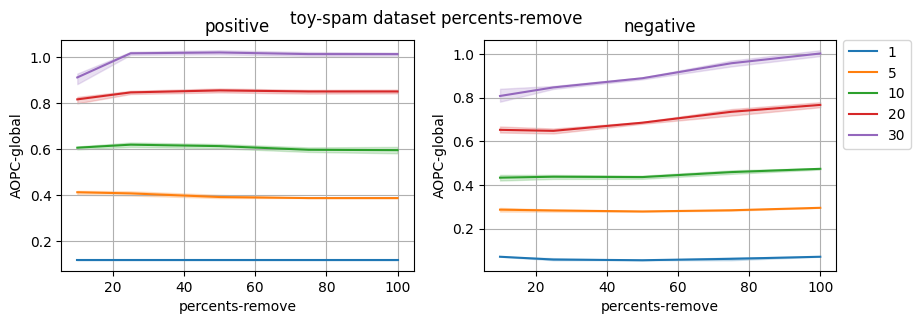

pos
0.1: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']
topk-0.1: ['great', 'love', 'loves', 'fun', 'favorite', 'loved', 'awesome', 'wonderful', 'game', 'perfect']
0.5: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'awesome', 'friends', 'christmas']
topk-0.5: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'friends', 'awesome', 'christmas']
topk-masking-0.1: ['great', 'love', 'loves', 'fun', 'loved', 'game', 'favorite', 'friends', 'perfect', 'awesome']

neg
0.1: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'cheap', 'product', 'money', 'thought']
topk-0.1: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'thought', 'cheap', 'product', 'plastic']
0.5: ['small', 'would', 'broke', 'disappointed', 'waste', 'product', 'money', 'thought', 'cheap', 'like']
topk-0.5: ['would', 'small', 'broke', 'disappointed', 'waste', 'product', 'money', 'work', 'cheap', 'thought']
topk-masking-

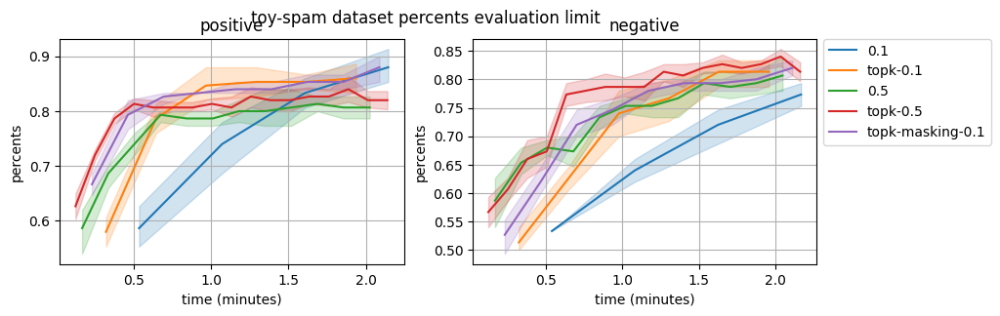

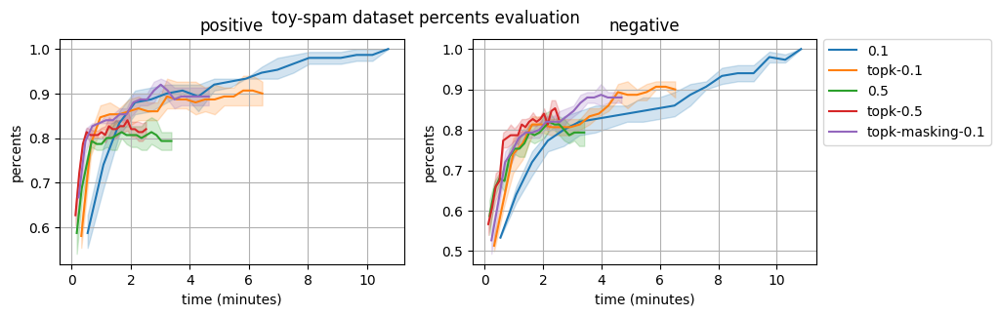

pos
0.1: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']
topk-0.1: ['great', 'love', 'loves', 'fun', 'favorite', 'loved', 'awesome', 'wonderful', 'game', 'perfect']
0.5: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'awesome', 'friends', 'christmas']
topk-0.5: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'friends', 'awesome', 'christmas']
topk-masking-0.1: ['great', 'love', 'loves', 'fun', 'loved', 'game', 'favorite', 'friends', 'perfect', 'awesome']

neg
0.1: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'cheap', 'product', 'money', 'thought']
topk-0.1: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'thought', 'cheap', 'product', 'plastic']
0.5: ['small', 'would', 'broke', 'disappointed', 'waste', 'product', 'money', 'thought', 'cheap', 'like']
topk-0.5: ['would', 'small', 'broke', 'disappointed', 'waste', 'product', 'money', 'work', 'cheap', 'thought']
topk-masking-

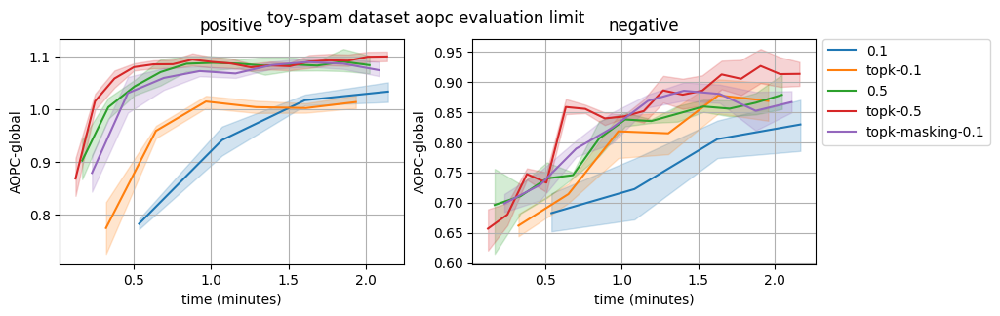

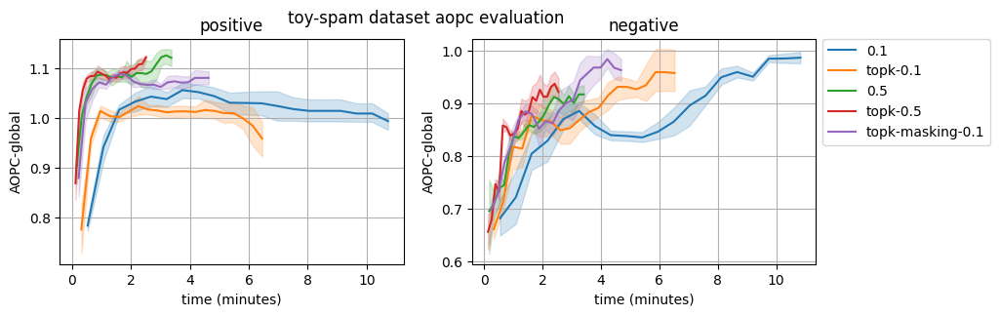

In [4]:
aopc.compare_all()

## Toy-Spam stop-words

In [3]:
ds_name = 'toy-spam'
model_type = 'tinybert'
path = f'results/mp/{model_type}/{ds_name}/{sorting}/'
aopc = AOPC(path, tokenizer, base_opt = 'stop-words')

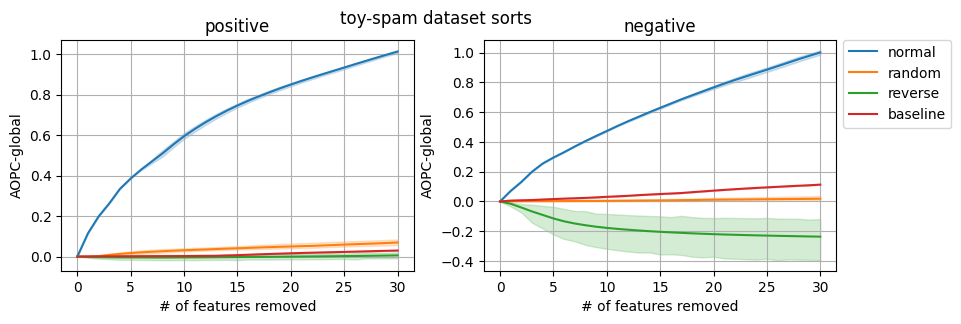

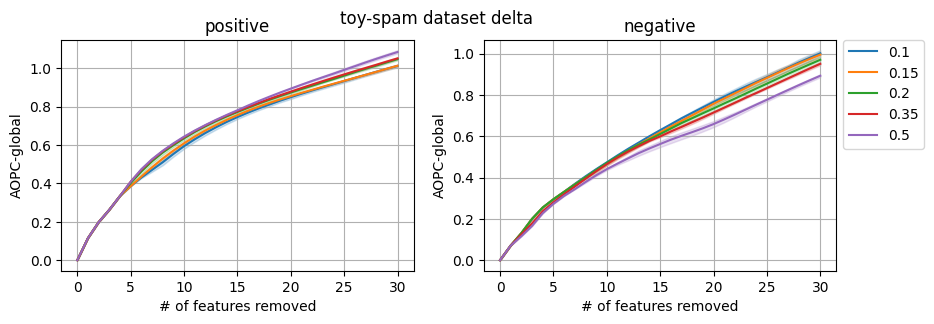

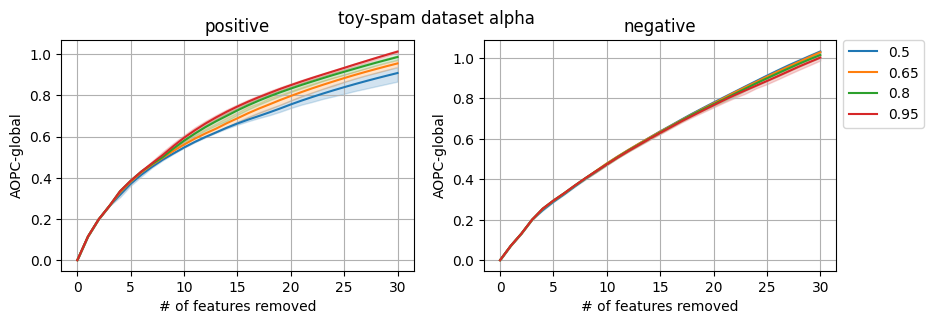

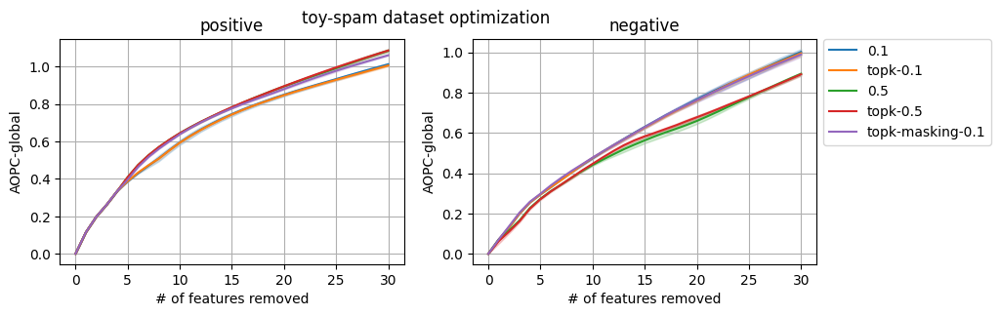

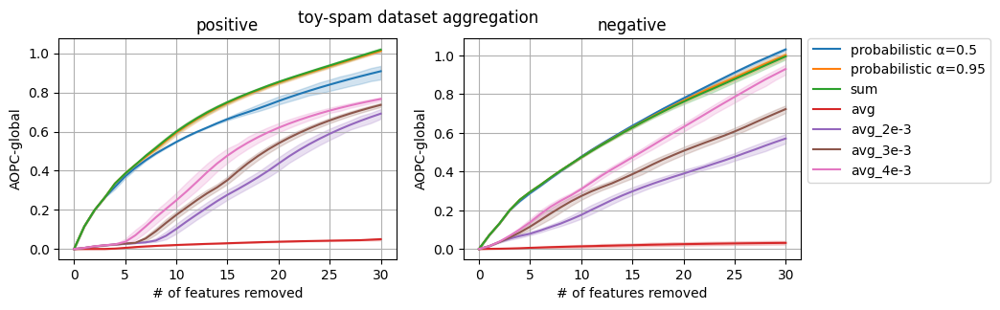

...

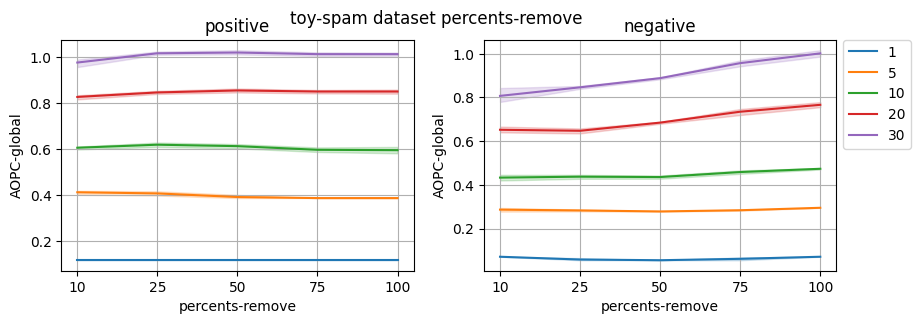

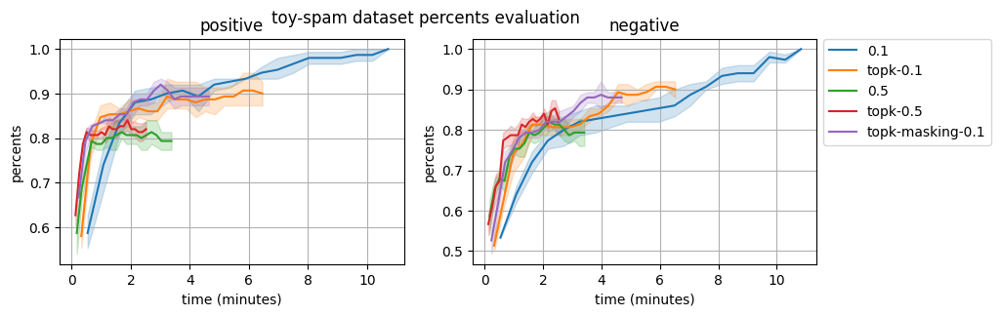

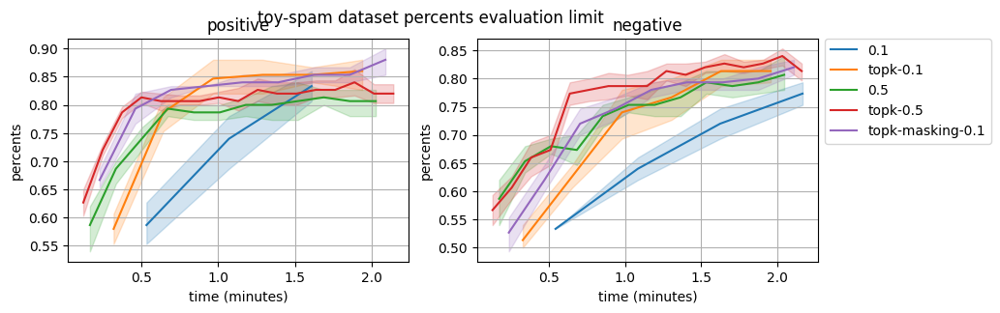

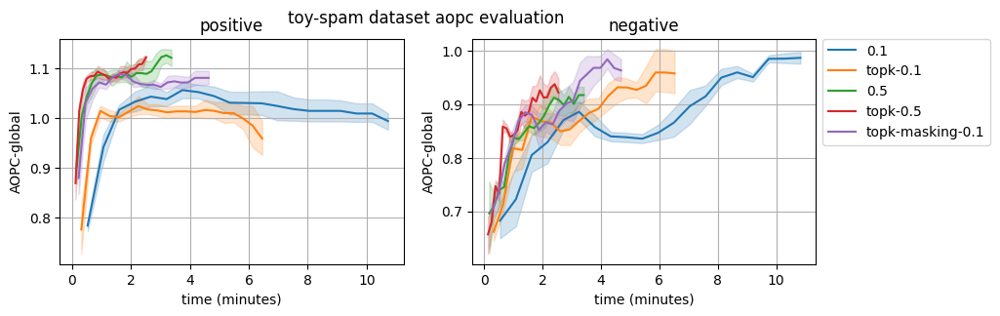

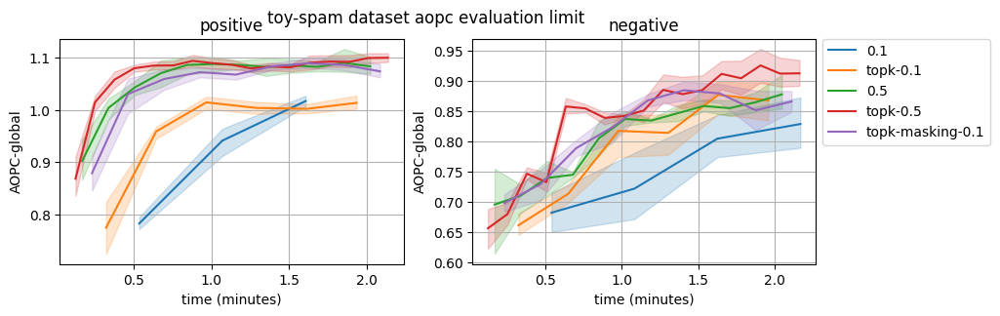

In [14]:
aopc.compare_all(verbose=False)

pos
normal: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']
random: ['teens', 'laughing', 'loves', 'loving', 'delighted', 'expansion', 'thrilled', 'girls', 'new', 'cards']
reverse: ['get', 'daughter', 'price', 'made', 'played', 'first', '5', 'came', 'new', 'way']
baseline: ['teaches', 'bring', 'introduced', 'parties', 'grandparents', 'childhood', 'complex', 'sequence', 'trips', 'conversation']

neg
normal: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'cheap', 'product', 'money', 'thought']
random: ['geo', 'pencil', '90', 'fix', 'failed', 'gets', 'balance', 'pounds', 'considering', 'answers']
reverse: ['play', 'good', 'grandson', 'nice', 'year', 'children', 'also', 'son', 'games', 'looking']
baseline: ['hole', 'seam', 'garbage', 'weak', 'balloon', 'returned', 'trash', 'cracked', 'float', 'leak']


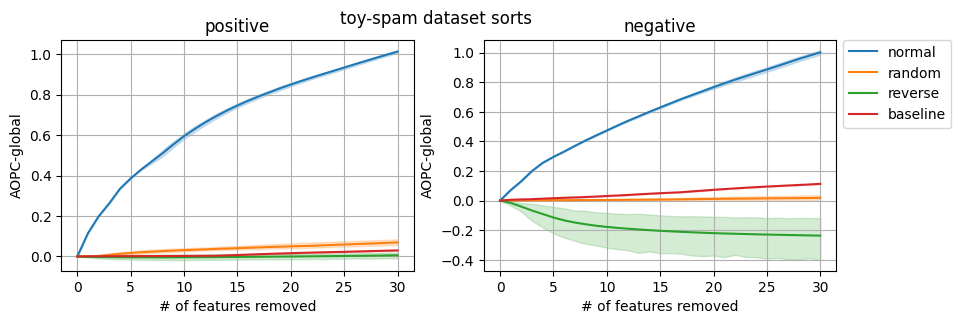

pos
0.1: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']
0.15: ['great', 'love', 'loves', 'fun', 'favorite', 'loved', 'awesome', 'wonderful', 'game', 'perfect']
0.2: ['great', 'love', 'loves', 'fun', 'loved', 'game', 'favorite', 'awesome', 'wonderful', 'excellent']
0.35: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'awesome', 'wonderful', 'friends']
0.5: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'awesome', 'friends', 'christmas']

neg
0.1: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'cheap', 'product', 'money', 'thought']
0.15: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'thought', 'product', 'cheap', 'item']
0.2: ['small', 'broke', 'disappointed', 'would', 'waste', 'product', 'smaller', 'thought', 'cheap', 'item']
0.35: ['small', 'broke', 'would', 'disappointed', 'waste', 'cheap', 'thought', 'smaller', 'product', 'money']
0.5: ['small', 'would', 'broke', 'di

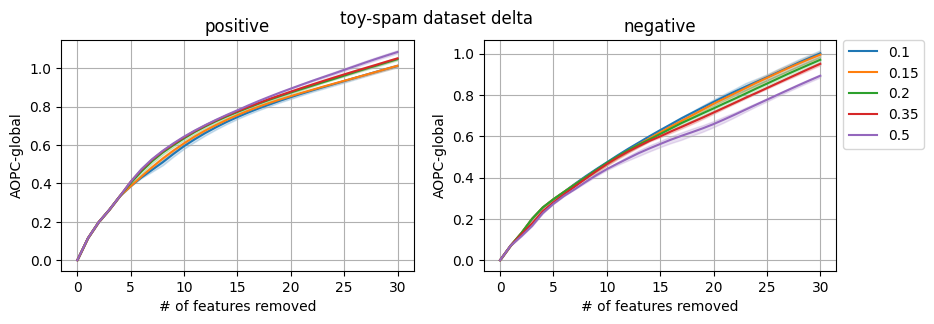

pos
0.95: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']
0.8: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']
0.65: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'perfect', 'classic']
0.5: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'awesome', 'friends', 'christmas']

neg
0.95: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'cheap', 'product', 'money', 'thought']
0.8: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'cheap', 'thought', 'money', 'product']
0.65: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'cheap', 'thought', 'money', 'product']
0.5: ['small', 'would', 'broke', 'disappointed', 'waste', 'product', 'money', 'thought', 'cheap', 'like']


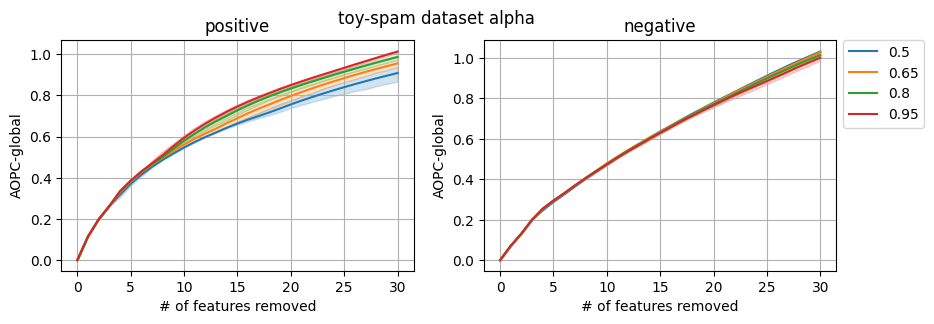

pos
0.1: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']
topk-0.1: ['great', 'love', 'loves', 'fun', 'favorite', 'loved', 'awesome', 'wonderful', 'game', 'perfect']
0.5: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'awesome', 'friends', 'christmas']
topk-0.5: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'friends', 'awesome', 'christmas']
topk-masking-0.1: ['great', 'love', 'loves', 'fun', 'loved', 'game', 'favorite', 'friends', 'perfect', 'awesome']

neg
0.1: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'cheap', 'product', 'money', 'thought']
topk-0.1: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'thought', 'cheap', 'product', 'plastic']
0.5: ['small', 'would', 'broke', 'disappointed', 'waste', 'product', 'money', 'thought', 'cheap', 'like']
topk-0.5: ['would', 'small', 'broke', 'disappointed', 'waste', 'product', 'money', 'work', 'cheap', 'thought']
topk-masking-

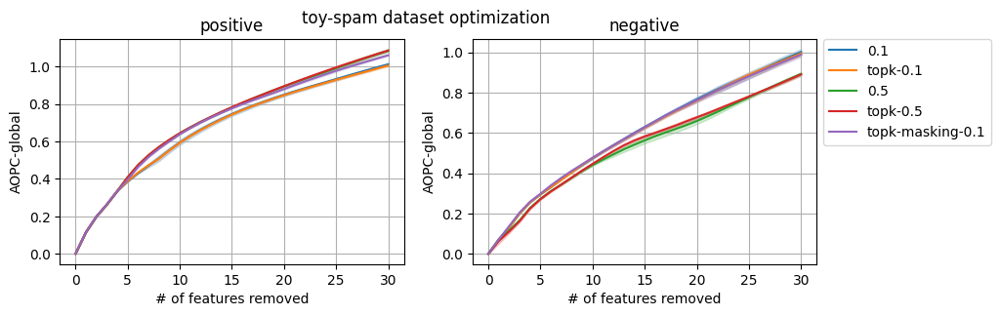

pos
probabilistic α=0.5: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'classic', 'perfect']
probabilistic α=0.95: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']
sum: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'game', 'wonderful', 'loved', 'perfect']
avg: ['incredible', 'fabulous', 'charming', 'wonderful', 'awesome', 'amazing', 'delightful', 'fantastic', 'greatest', 'favorite']
avg_2e-3: ['wonderful', 'awesome', 'amazing', 'favorite', 'enjoyable', 'classic', 'excellent', 'thank', 'great', 'love']
avg_3e-3: ['wonderful', 'awesome', 'amazing', 'favorite', 'classic', 'excellent', 'thank', 'great', 'love', 'loves']
avg_4e-3: ['wonderful', 'awesome', 'favorite', 'classic', 'excellent', 'great', 'love', 'loves', 'best', 'perfect']

neg
probabilistic α=0.5: ['small', 'broke', 'disappointed', 'waste', 'would', 'smaller', 'cheap', 'thought', 'money', 'poor']
probabilistic α=0.95: ['small', 'broke',

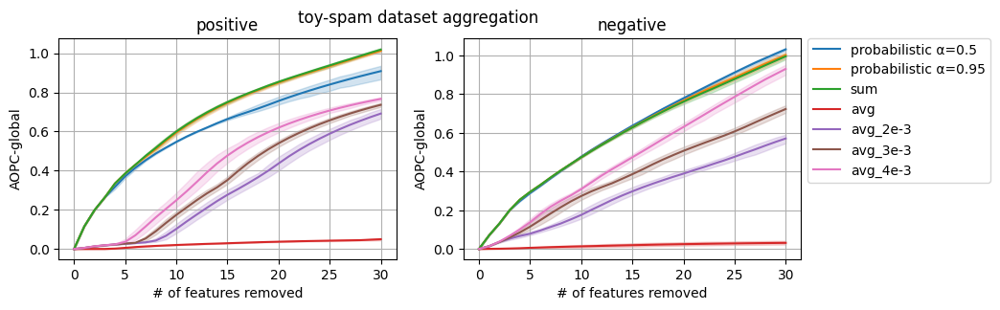

pos
10: ['great', 'love', 'fun', 'game', 'awesome', 'favorite', 'loves', 'wonderful', 'best', 'family']
25: ['great', 'love', 'fun', 'loves', 'game', 'favorite', 'awesome', 'wonderful', 'loved', 'best']
50: ['great', 'love', 'loves', 'fun', 'favorite', 'game', 'awesome', 'loved', 'wonderful', 'classic']
75: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'loved', 'game', 'wonderful', 'classic']
100: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']

neg
10: ['small', 'disappointed', 'broke', 'would', 'apart', 'waste', 'cheap', 'plastic', 'work', 'broken']
25: ['broke', 'small', 'would', 'disappointed', 'waste', 'cheap', 'plastic', 'apart', 'money', 'item']
50: ['broke', 'disappointed', 'small', 'waste', 'would', 'money', 'work', 'cheap', 'product', 'item']
75: ['small', 'broke', 'disappointed', 'waste', 'would', 'money', 'cheap', 'product', 'work', 'poor']
100: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'chea

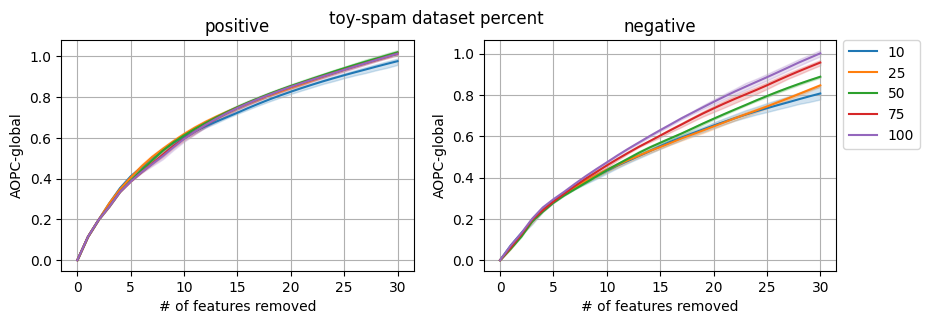

pos
10: ['great', 'love', 'fun', 'game', 'awesome', 'favorite', 'loves', 'wonderful', 'best', 'family']
25: ['great', 'love', 'fun', 'loves', 'game', 'favorite', 'awesome', 'wonderful', 'loved', 'best']
50: ['great', 'love', 'loves', 'fun', 'favorite', 'game', 'awesome', 'loved', 'wonderful', 'classic']
75: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'loved', 'game', 'wonderful', 'classic']
100: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']

neg
10: ['small', 'disappointed', 'broke', 'would', 'apart', 'waste', 'cheap', 'plastic', 'work', 'broken']
25: ['broke', 'small', 'would', 'disappointed', 'waste', 'cheap', 'plastic', 'apart', 'money', 'item']
50: ['broke', 'disappointed', 'small', 'waste', 'would', 'money', 'work', 'cheap', 'product', 'item']
75: ['small', 'broke', 'disappointed', 'waste', 'would', 'money', 'cheap', 'product', 'work', 'poor']
100: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'chea

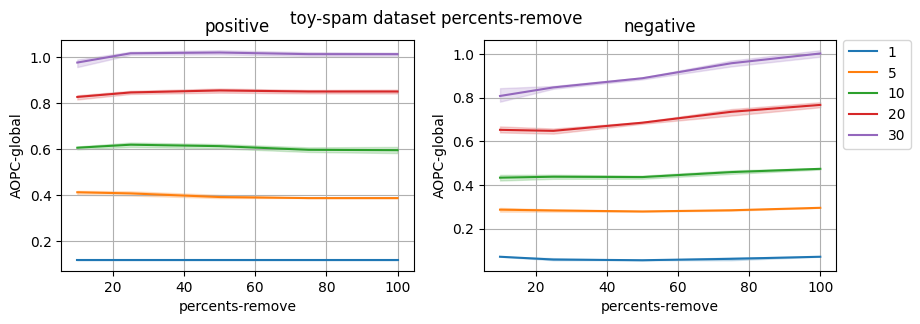

pos
0.1: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']
topk-0.1: ['great', 'love', 'loves', 'fun', 'favorite', 'loved', 'awesome', 'wonderful', 'game', 'perfect']
0.5: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'awesome', 'friends', 'christmas']
topk-0.5: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'friends', 'awesome', 'christmas']
topk-masking-0.1: ['great', 'love', 'loves', 'fun', 'loved', 'game', 'favorite', 'friends', 'perfect', 'awesome']

neg
0.1: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'cheap', 'product', 'money', 'thought']
topk-0.1: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'thought', 'cheap', 'product', 'plastic']
0.5: ['small', 'would', 'broke', 'disappointed', 'waste', 'product', 'money', 'thought', 'cheap', 'like']
topk-0.5: ['would', 'small', 'broke', 'disappointed', 'waste', 'product', 'money', 'work', 'cheap', 'thought']
topk-masking-

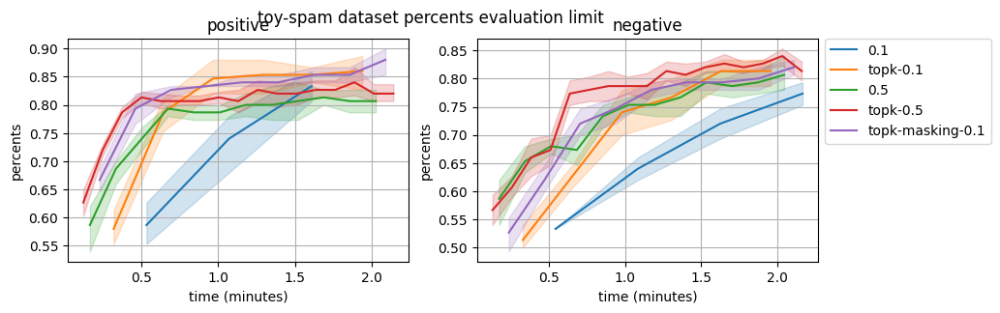

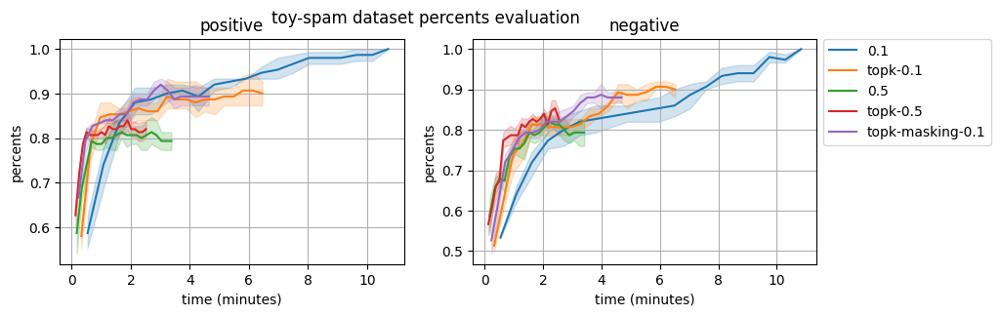

pos
0.1: ['great', 'love', 'loves', 'fun', 'favorite', 'awesome', 'wonderful', 'loved', 'game', 'perfect']
topk-0.1: ['great', 'love', 'loves', 'fun', 'favorite', 'loved', 'awesome', 'wonderful', 'game', 'perfect']
0.5: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'awesome', 'friends', 'christmas']
topk-0.5: ['great', 'love', 'loves', 'fun', 'game', 'loved', 'favorite', 'friends', 'awesome', 'christmas']
topk-masking-0.1: ['great', 'love', 'loves', 'fun', 'loved', 'game', 'favorite', 'friends', 'perfect', 'awesome']

neg
0.1: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'cheap', 'product', 'money', 'thought']
topk-0.1: ['small', 'broke', 'disappointed', 'would', 'waste', 'smaller', 'thought', 'cheap', 'product', 'plastic']
0.5: ['small', 'would', 'broke', 'disappointed', 'waste', 'product', 'money', 'thought', 'cheap', 'like']
topk-0.5: ['would', 'small', 'broke', 'disappointed', 'waste', 'product', 'money', 'work', 'cheap', 'thought']
topk-masking-

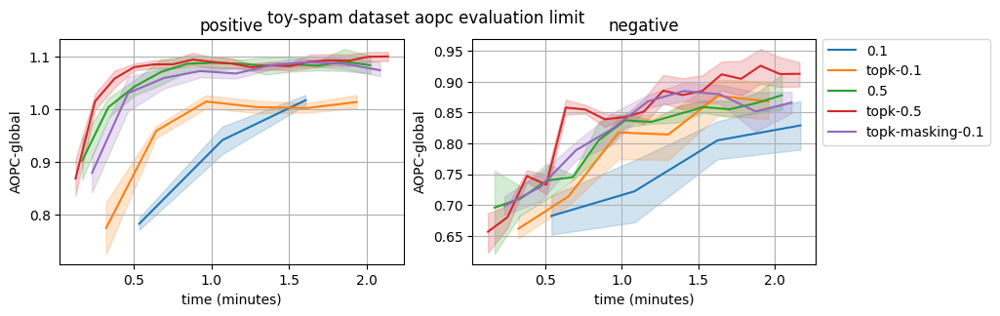

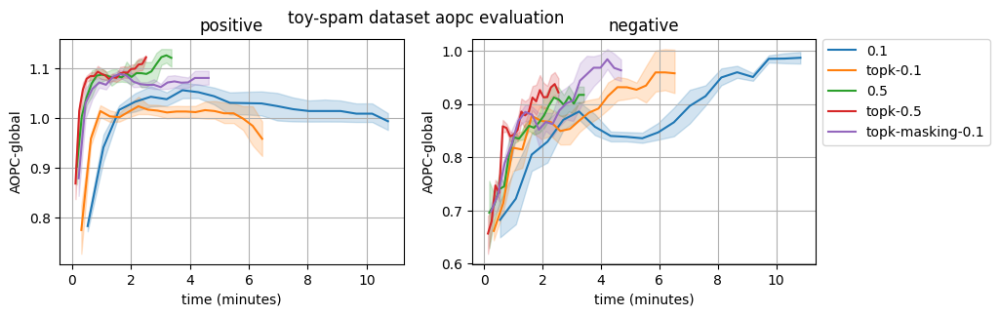

In [4]:
aopc.compare_all()

## Toy-Spam alpha 0.5

In [8]:
ds_name = 'toy-spam'
model_type = 'tinybert'
path = f'results/mp/{model_type}/{ds_name}/{sorting}/'
aopc = AOPC(path, tokenizer, alpha=0.5)

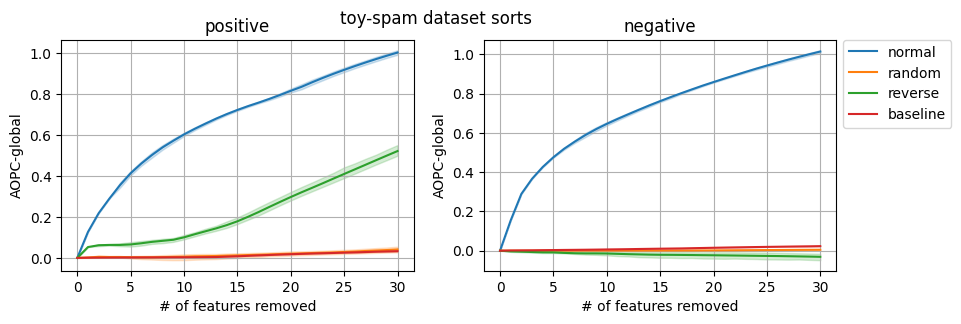

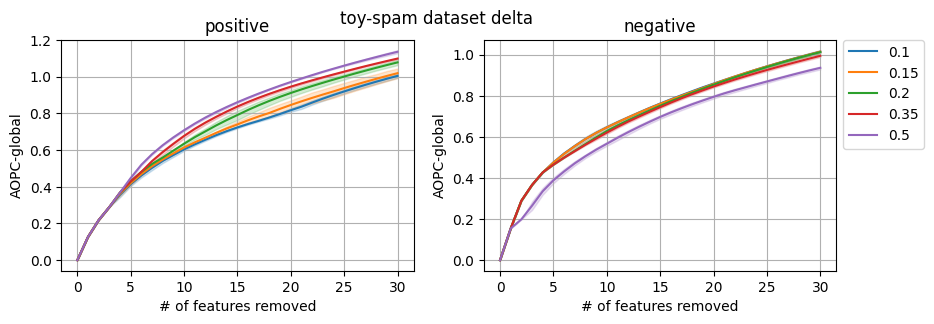

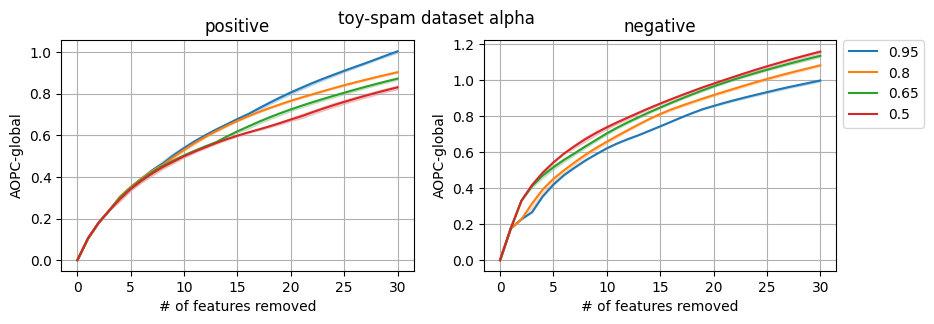

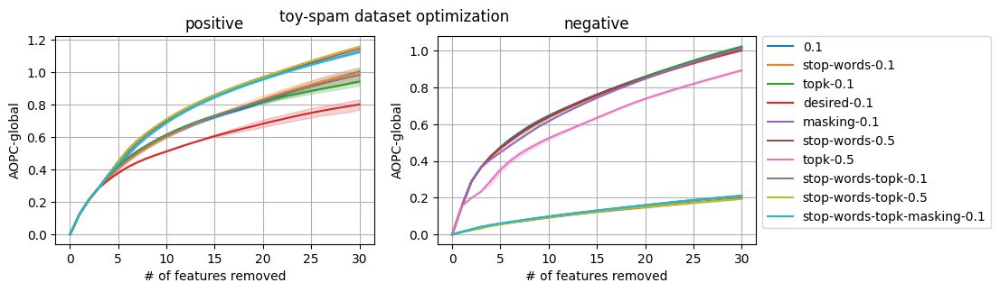

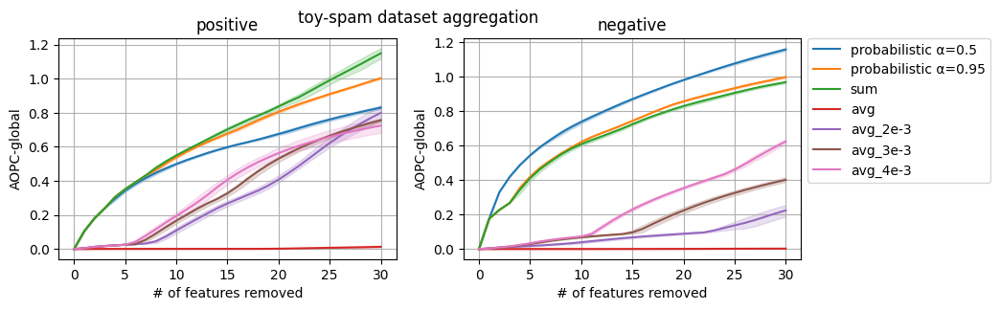

...

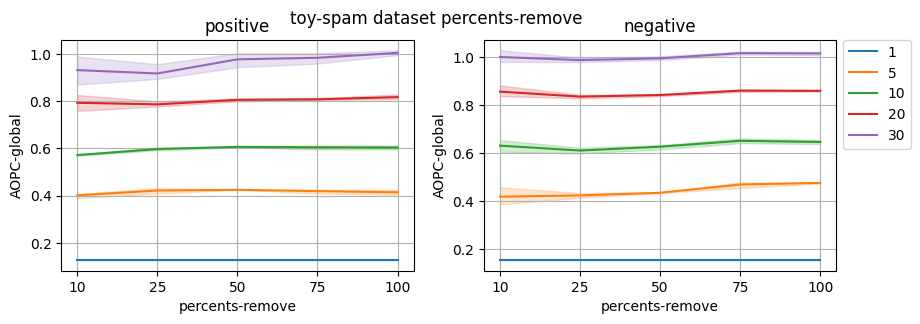

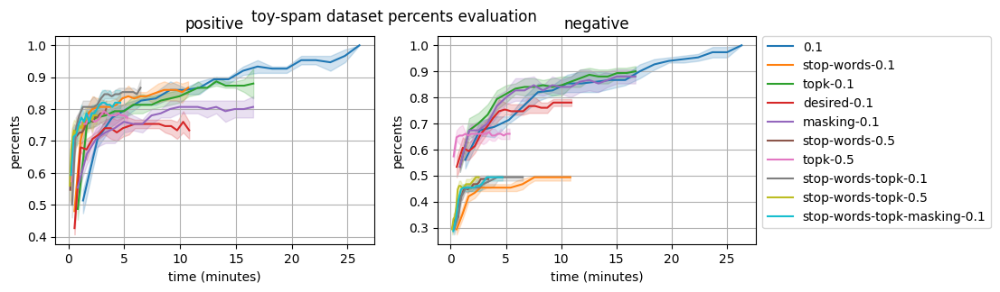

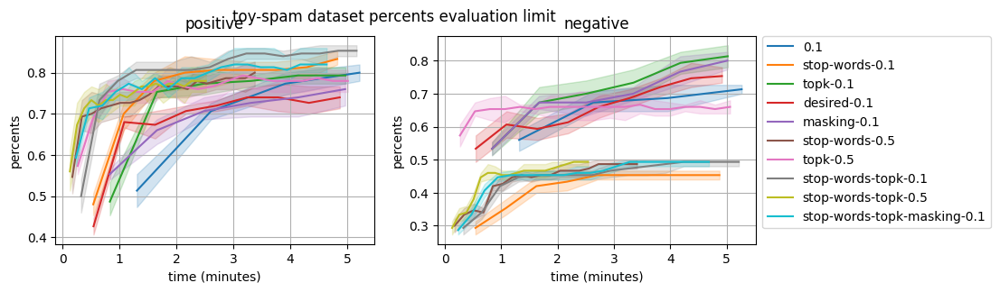

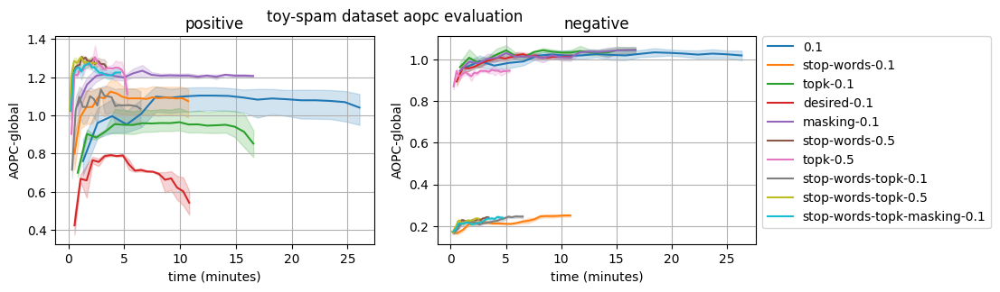

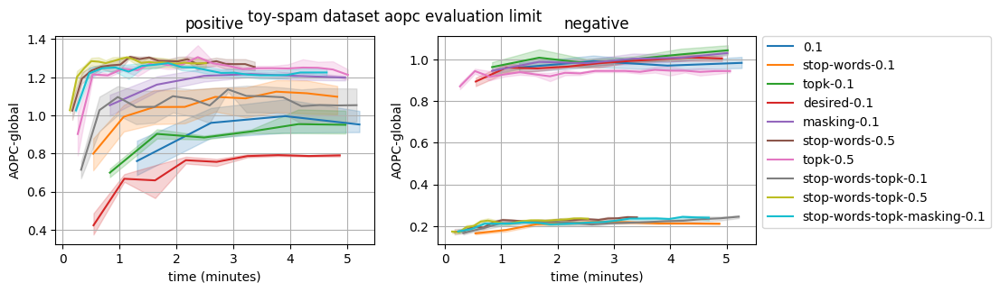

In [9]:
aopc.compare_all(verbose=False)

## Toy-Spam

In [3]:
ds_name = 'toy-spam'
model_type = 'tinybert'
path = f'results/mp/{model_type}/{ds_name}/{sorting}/'
aopc = AOPC(path, tokenizer)

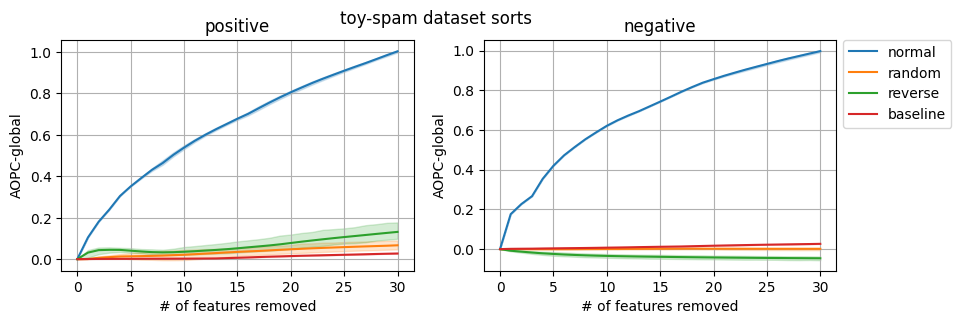

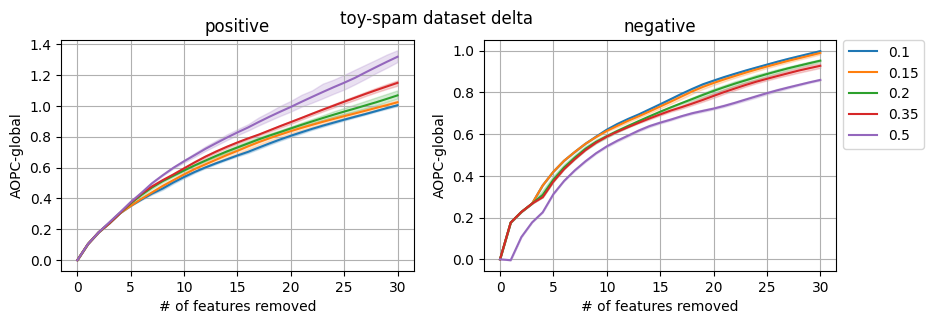

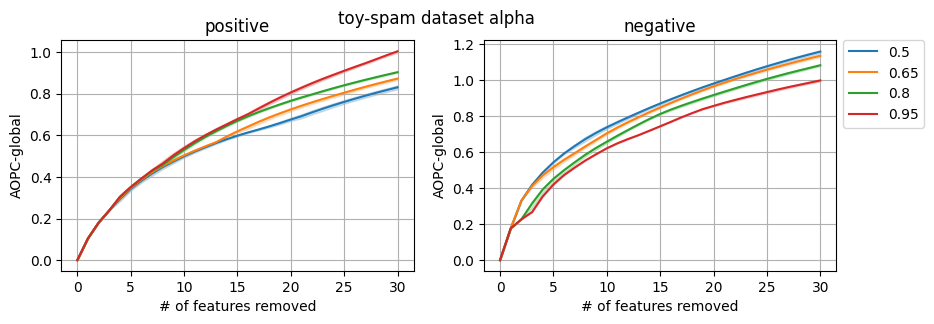

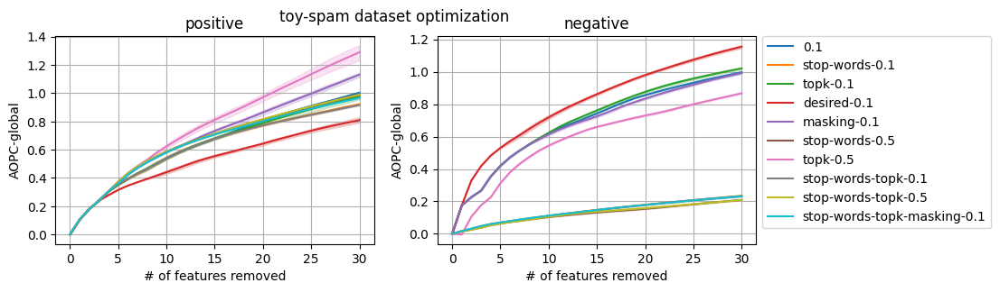

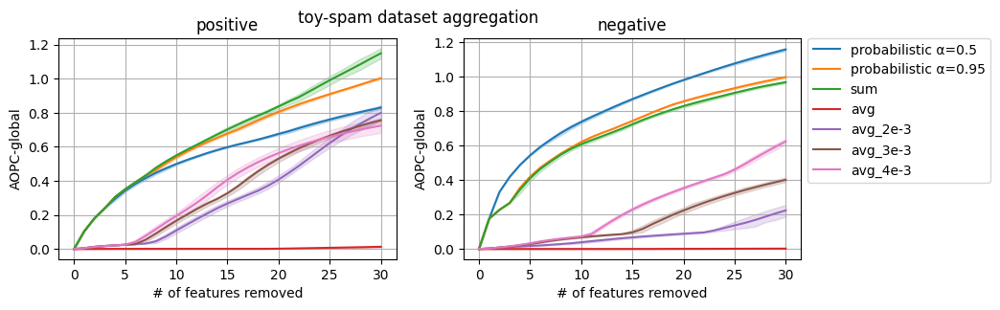

...

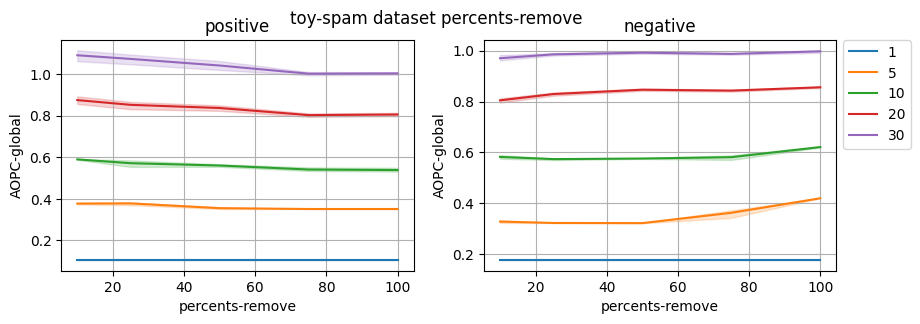

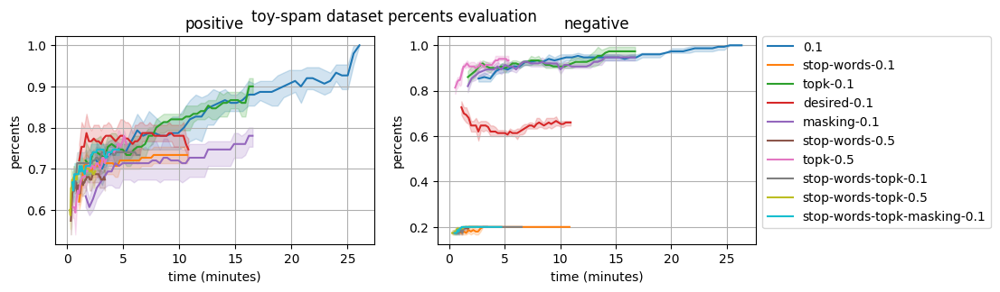

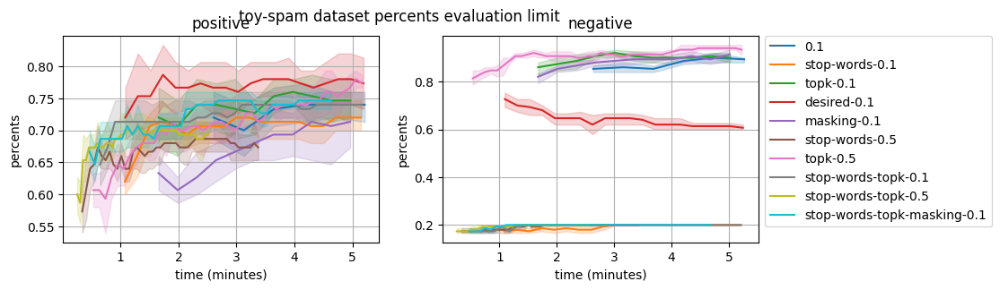

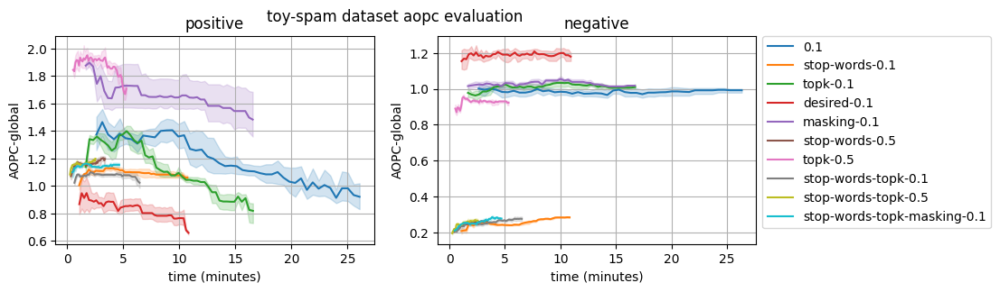

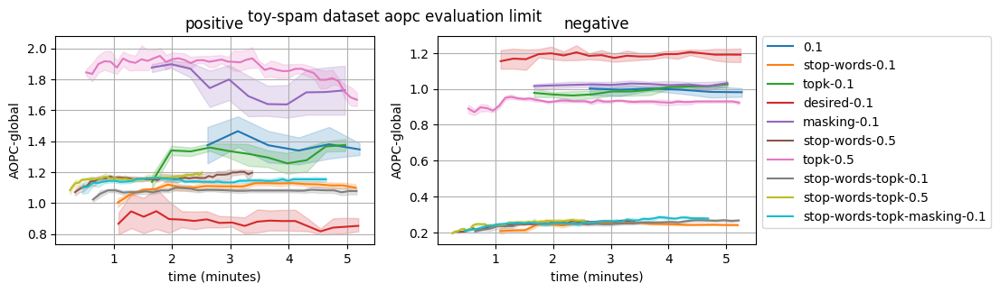

In [4]:
aopc.compare_all(verbose=False)